# Insurance Claim Fraud Detection

#### Project Description
- Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

#### Independent Variables

1. months_as_customer: Number of months of patronage
2. age: the length of time a customer has lived or a thing has existed
3. policy_number: It is a unique id given to the customer, to track the subscription status and other details of customer
4. policy_bind_date:date which document that is given to customer after we accept your proposal for insurance
5. policy_state: This identifies who is the insured, what risks or property are covered, the policy limits, and the policy period
6. policy_csl: is basically Combined Single Limit
7. policy_deductable: the amount of money that a customer is responsible for paying toward an insured loss
8. policy_annual_premium: This means the amount of Regular Premium payable by the Policyholder in a Policy Year
9. umbrella_limit: This means extra insurance that provides protection beyond existing limits and coverages of other policies
10. insured_zip: It is the zip code where the insurance was made
11. insured_sex: This refres to either of the two main categories (male and female) into which customer are divided on the basis of their reproductive functions
12. insured_education_level: This refers to the Level of education of the customer
13. insured_occupation: This refers Occupation of the customer
14. insured_hobbies: This refers to an activity done regularly by customer in his/her leisure time for pleasure.
15. insured_relationship: This whether customer is: single; or. married; or. in a de facto relationship (that is, living together but not married); or. in a civil partnership
16. capital-gains: This refers to profit accrued due to insurance premium
17. capital-loss: This refers to the losses incurred due to insurance claims
18. incident_date: This refers to the date which claims where made by customers
19. incident_type: This refers to the type of claim/vehicle damage made by customer
20. collision_type: This refers to the area of damage on the vehicle
21. incident_severity: This refers to the extent/level of damage
22. authorities_contacted: This refers to the government agencies that were contacted after damage
23. incident_state: This refers to the state at which the accident happened
24. incident_city: This refers to the city at which the accident happened
25. 1ncident_location: This refers to the location at which the accident happened
26. incident_hour_of_the_day: The period of the day which accident took place
27. number_of_vehicles_involved: This refers to number of vehicles involved the accident
28. property_damage: This refers to whether property was damaged or not
29. bodily_injuries: This refers to injuries sustained
30. witnesses: This refers to the number of witnesses involved
31. police_report_available: This refers to whether the report on damage was documented or not
32. total_claim_amount: This refers to the financial implications involved in claims
33. injury_claim: This refers to physical injuries sustained
34. property_claim: This refers to property damages during incident
35. vehicle_claim: This refers to property damages during incident
36. auto_make: This refers to the make of the vehicle
37. auto_model: This refers to the model of the vehicle
38. auto_year: This refers to the year which the vehicle was manufactured
39. _c39:
40. fraud_reported

#### Dataset Link-  
•	https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Insurance%20Claim%20Fraud%20Detection/Automobile_insurance_fraud.csv



In [1]:
'''IMPORTING THE LIBRARIES
EPLORATORY DATA ANALYSIS
do non graphical analysis
ghraphical analysis
    univariate analysis
    bivariate analysis
    multivaraiate analysis
check outliers and remove if present
check multicollinearity
remove multicollinearity if present
apply feature scaling methods on numerical features
apply resampling methods to balance the classes(in classification problem
also apply feature selection methods)
Model Building
Cross Validation Score
Ploting ROC AUC Curve
Predicting the saved Model'''

'IMPORTING THE LIBRARIES\nEPLORATORY DATA ANALYSIS\ndo non graphical analysis\nghraphical analysis\n    univariate analysis\n    bivariate analysis\n    multivaraiate analysis\ncheck outliers and remove if present\ncheck multicollinearity\nremove multicollinearity if present\napply feature scaling methods on numerical features\napply resampling methods to balance the classes(in classification problem\nalso apply feature selection methods)\nModel Building\nCross Validation Score\nPloting ROC AUC Curve\nPredicting the saved Model'

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

#### As the column headers are not given we will have to add them

In [3]:
# Define the column names
columns = ['months_as_customer', 'age', 'policy_number', 'policy_bind_date', 'policy_state', 'policy_csl',
           'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip','insured_sex',
           'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 
           'capital-gains', 'capital-loss', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 
           'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'incident_hour_of_the_day',
           'number_of_vehicles_involved', 'property_damage', 'bodily_injuries', 'witnesses', 'police_report_available', 
           'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
           'auto_model','auto_year','fraud_reported', '_c39']

#### As per the understanding the details of column '_c39' are not given and the last column is 'Fraud_reported' which is thee target variable. Hense a minute change has beeen done bringing column '_c39' at the end in the dataframe and study it.   

In [4]:
# Load the dataset with column names
url = 'https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Insurance%20Claim%20Fraud%20Detection/Automobile_insurance_fraud.csv'
df = pd.read_csv(url, header=None, names=columns)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


#### Column headers have beeen assigned against each column properly , now we can move ahead with the EDA process

# Exploratory Data Analysis

In [5]:
df.shape

(1000, 40)

#### We will be working on  data with 1000 rows and 40 columns

In [6]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [7]:
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [8]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

#### OBSERVATION:
1. We observe that there are 2 columns with float datatype, 17 with int64 datatype and 21 columns with object dataype.
2. There are no null values except column '_c39' for which no values is know. 
3. It is observed in the dataset the some reading carry "?"  and may also carry white spaces. We need to check them and fill them. 

## Checking for NULL values if any in the data frame
#### np.nan, None, NaN and others..

In [10]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

#### All the rows in column '_c39' donot consist any value heense this column has to be dropped. 

## Let check how many question mark (" ?") inside dataset.

In [11]:
df.isin(['?']).sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

#### We  can clearly see that columns 'collision_type', 'property_damage', 'police_report_available' have some rows where the value is "?". We will have to treat them. 

#### Let replace ' ?' with np.NaN

In [12]:
df=df.replace('?',np.NaN)

### Finding Null values through heatmap.

<Axes: >

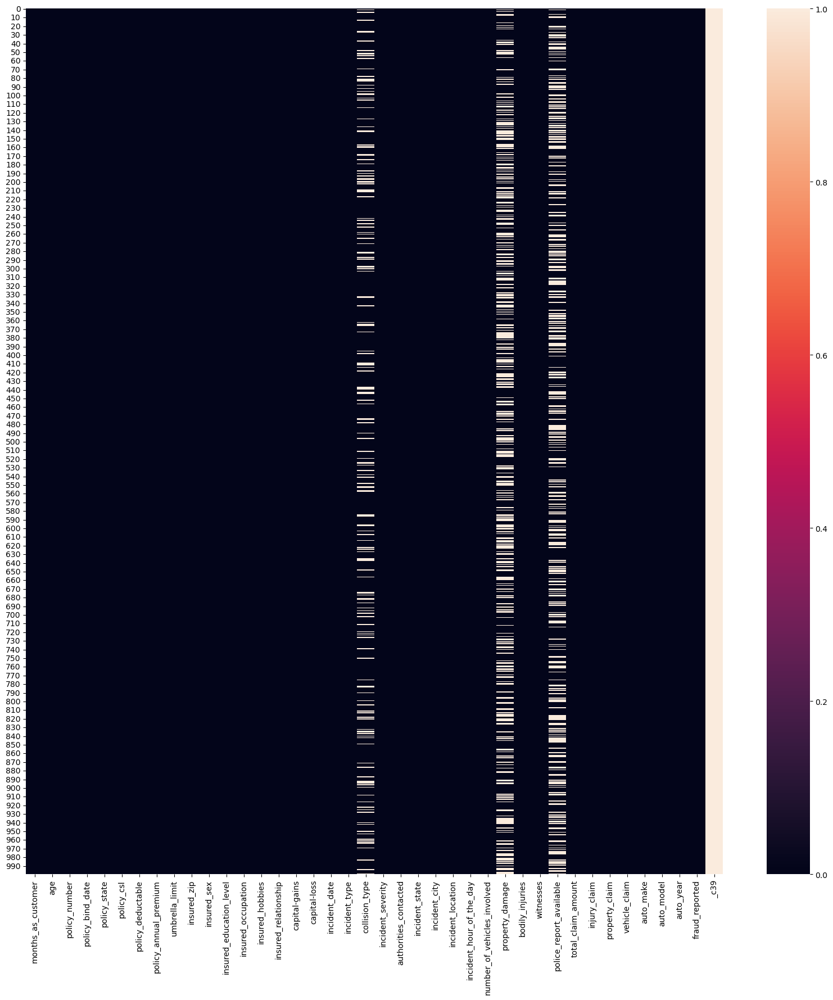

In [13]:
plt.figure(figsize=(20,20))
sns.heatmap(df.isnull())

#### Let check if any whitespace, 'NA' or '-' exist in dataset.

In [14]:
df.isin([' ','NA','-']).sum().any()

False

In [15]:
# checking the value counts of each column
for i in df.columns:
    print (df[i].value_counts())
    print('\n')

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64


43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64


521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64


01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64

#### Now lets drop columns '_c39' first to avoid ll the Null values 

In [16]:
df.drop(columns=['_c39'], inplace=True)

#### Let us drop two columns 'Policy Number', 'Incident_Location', 'insured_zip','policy_bind_date', 'incident_date', 'incident_hour_of_the_day','auto_year' as all the values are unique and they will not add any importance to the Analysis

In [17]:
df.drop(columns=['policy_number', 'incident_location', 'insured_zip','policy_bind_date', 'incident_date', 'incident_hour_of_the_day','auto_year'], inplace=True)

#### Now lets fill the Null values in columns 'collision_type', 'property_damage', 'police_report_available'.

#### As all the three columns are categorical columns we will use Mode imputation. 

In [18]:
df['collision_type'] = df['collision_type'].fillna(df['collision_type'].mode()[0])
df['property_damage'] = df['property_damage'].fillna(df['property_damage'].mode()[0])
df['police_report_available'] = df['police_report_available'].fillna(df['police_report_available'].mode()[0])

### Finding null values if any 

In [19]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_claim                  0
auto_make                      0
auto_model

### Finding null values if any by heatmap

<Axes: >

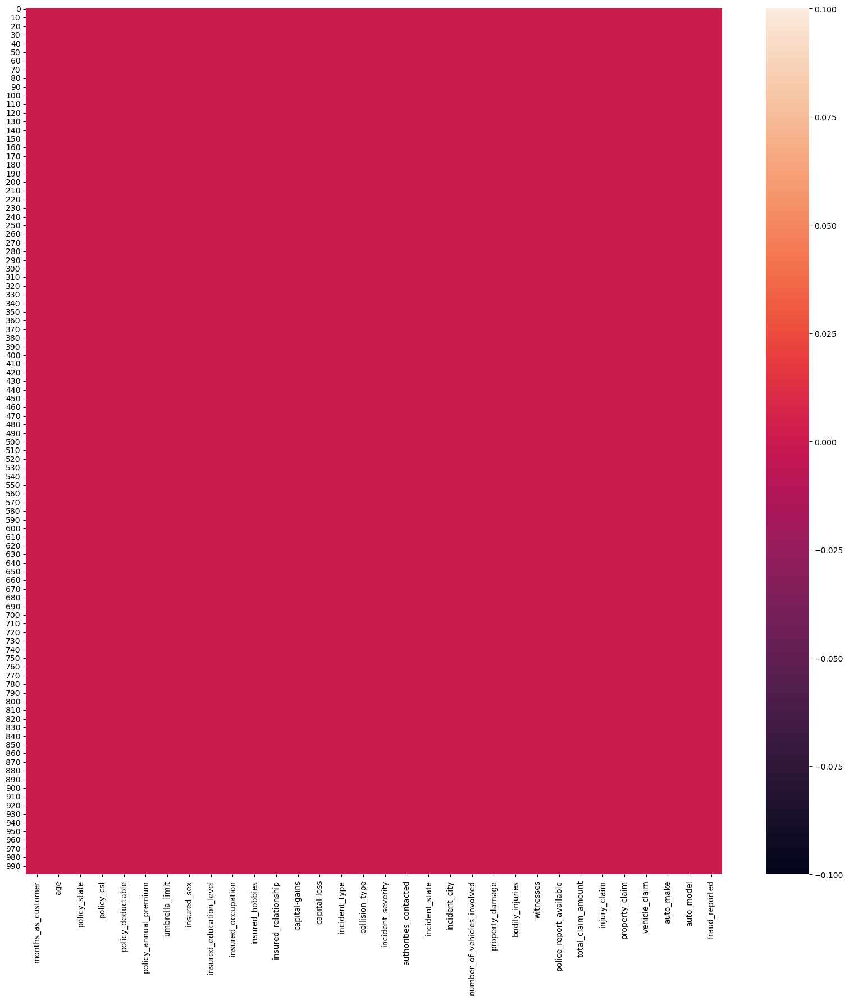

In [20]:
plt.figure(figsize=(20,20))
sns.heatmap(df.isnull())

#### Finally all the missing values have been filled

# Segregating Numerical and Categorical Columns 

In [21]:
#checking for categorical columns
categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=="object":
        categorical_col.append(i)
print("Categorical Columns:",categorical_col)

#checking numerical Columns
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!="object":
        numerical_col.append(i)
print("Numerical Columns:",numerical_col)

Categorical Columns: ['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']
Numerical Columns: ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'capital-gains', 'capital-loss', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']


# Data Visualization and Interpretation

## Univariate Analysis

In [22]:
#Finding counts of Fraud Detection 
df['fraud_reported'].value_counts() # Count number of frauds vs non-frauds

N    753
Y    247
Name: fraud_reported, dtype: int64

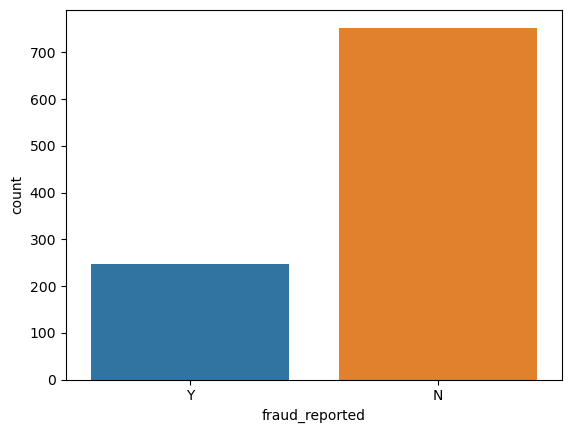

N    75.3
Y    24.7
Name: fraud_reported, dtype: float64


In [23]:
# Plot distribution of fraud_reported
sns.countplot(x='fraud_reported', data=df)
plt.show()
# Calculate the percentage of each category in the fraud_reported column
fraud_reported_counts = df['fraud_reported'].value_counts(normalize=True) * 100
# Display the percentages
print(fraud_reported_counts)

-  People who have applied for insurance are were Fraud cases are 24.7% where as Non-frauds were 75.3%

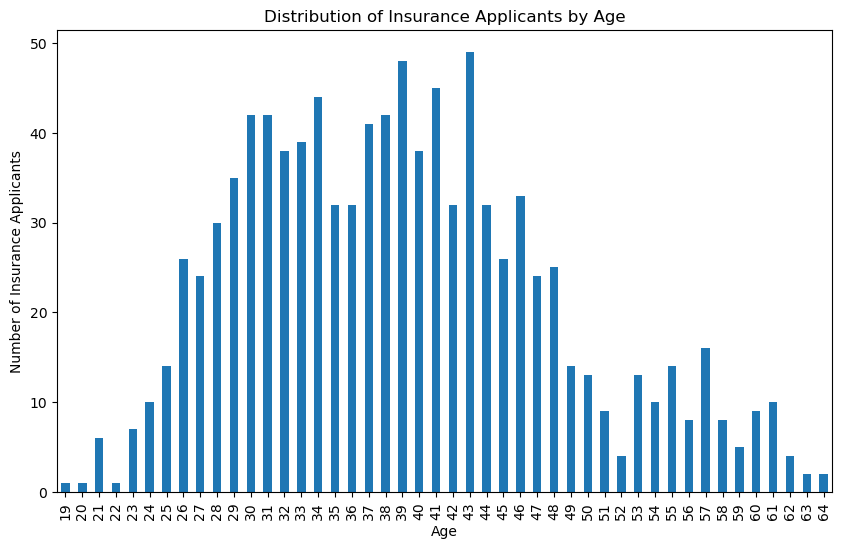

In [24]:
# Group by age and count the number of occurrences
age_counts = df['age'].value_counts().sort_index()

# Plot the distribution of ages
plt.figure(figsize=(10, 6))
age_counts.plot(kind='bar')
plt.xlabel('Age')
plt.ylabel('Number of Insurance Applicants')
plt.title('Distribution of Insurance Applicants by Age')
plt.show()

- People who have frequestly applied for insurance are 43 yrs, followed by 39 yrs, 41 yrs, 34 yrs

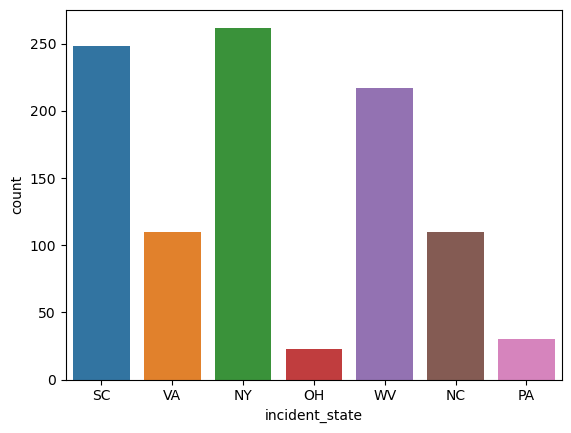

In [25]:
# Plot distribution of incident_state
df['incident_state'].value_counts()
sns.countplot(x='incident_state', data=df)
plt.show()

- Most of the cases reported are from NY followed by SC. 



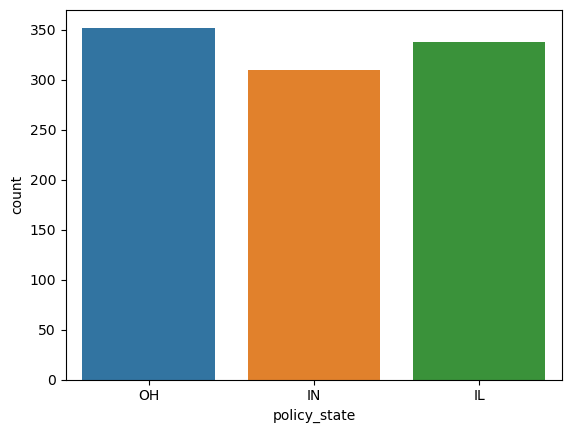

In [26]:
# Plot distribution of policy_state
df['policy_state'].value_counts()
sns.countplot(x='policy_state', data=df)
plt.show()

- OH has the highest policy_state 

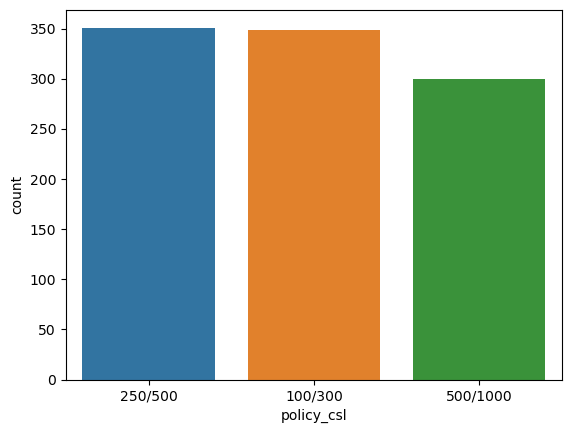

In [27]:
# Plot distribution of policy_csl
df['policy_csl'].value_counts()
sns.countplot(x='policy_csl', data=df)
plt.show()

- Highest combined single unit is 250/500 followed by 100/300

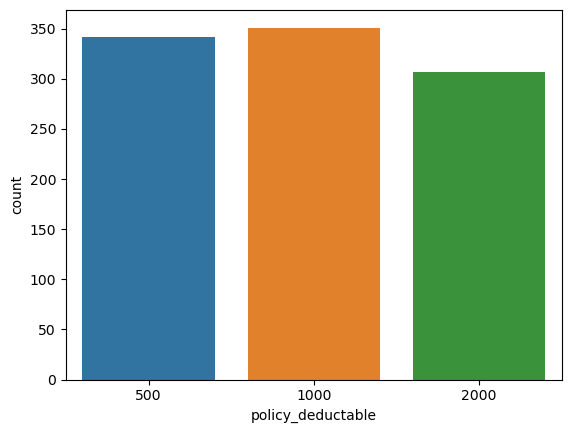

In [28]:
# Plot distribution of policy_deductable
df['policy_deductable'].value_counts()
sns.countplot(x='policy_deductable', data=df)
plt.show()

- The highest amount of money that a customer is responsible for paying toward an insured loss is 1000.

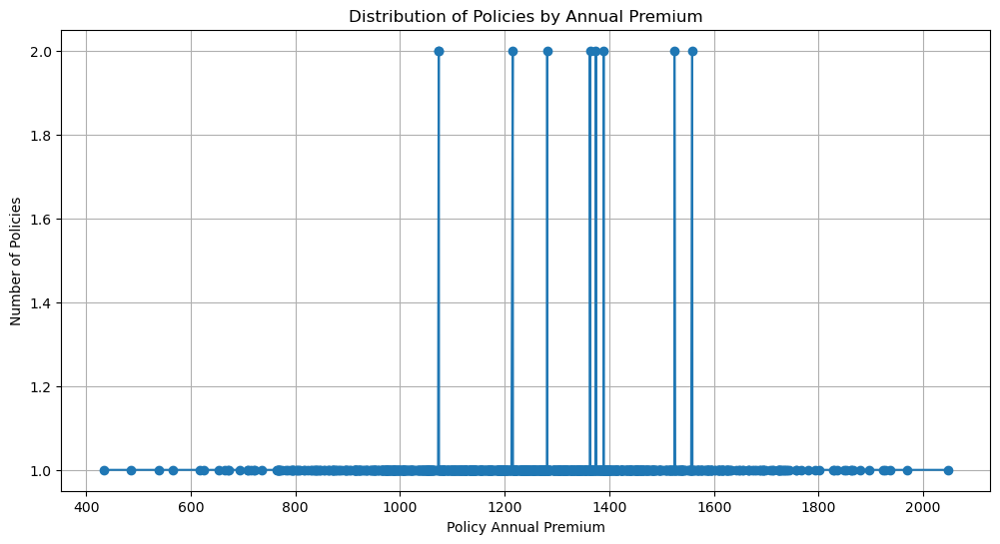

In [29]:
# Group by policy_annual_premium and count the number of occurrences
policy_annual_premium_counts = df['policy_annual_premium'].value_counts().sort_index()

# Plot the distribution of policy_annual_premium
plt.figure(figsize=(12, 6))
plt.plot(policy_annual_premium_counts.index, policy_annual_premium_counts.values, marker='o')
plt.xlabel('Policy Annual Premium')
plt.ylabel('Number of Policies')
plt.title('Distribution of Policies by Annual Premium')
plt.grid(True)
plt.show()

In [30]:
# Find the maximum and minimum policy_annual_premium
max_premium = df['policy_annual_premium'].max()
min_premium = df['policy_annual_premium'].min()

print(f"The maximum policy annual premium is: ${max_premium}")
print(f"The minimum policy annual premium is: ${min_premium}")

The maximum policy annual premium is: $2047.59
The minimum policy annual premium is: $433.33


#### the Highest Annual premium is 2047.59  and minimum is 433.33

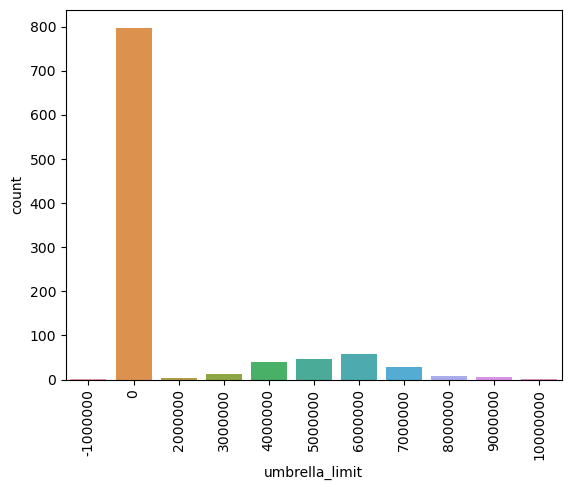

In [31]:
# Plot distribution of umbrella_limit
df['umbrella_limit'].value_counts()
sns.countplot(x='umbrella_limit', data=df)
plt.xticks(rotation=90)
plt.show()

- The highest umbrella limit seems to be '0'

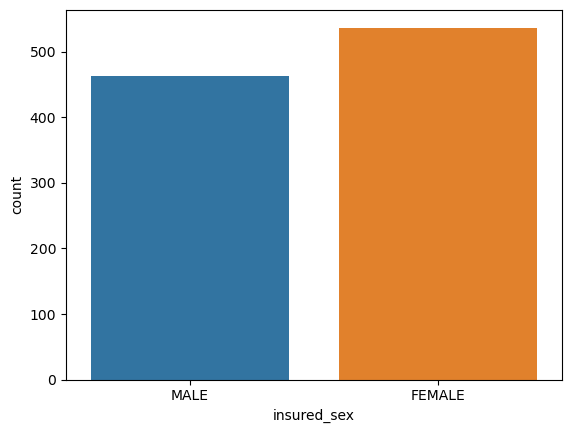

In [32]:
# Plot distribution of insured_sex
df['insured_sex'].value_counts()
sns.countplot(x='insured_sex', data=df)
plt.show()

- Female are insured more than Males

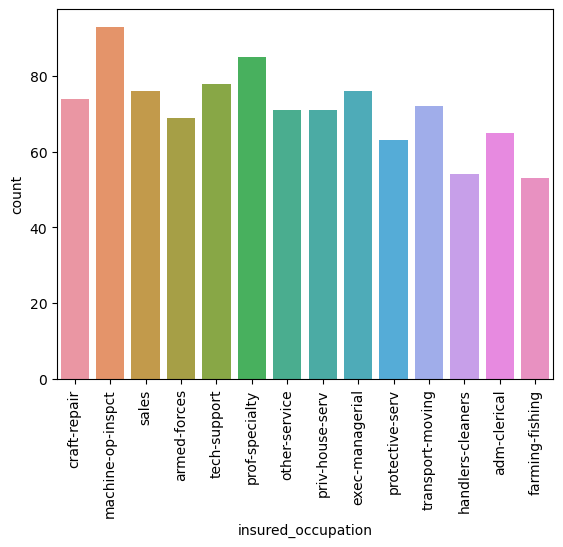

In [33]:
# Plot distribution of insured_occupation
df['insured_occupation'].value_counts()
sns.countplot(x='insured_occupation', data=df)
plt.xticks(rotation=90)
plt.show()

- Majority of the people who claimed Insurance belong to occupation of machine-op-inspect followed by prof-speciality.

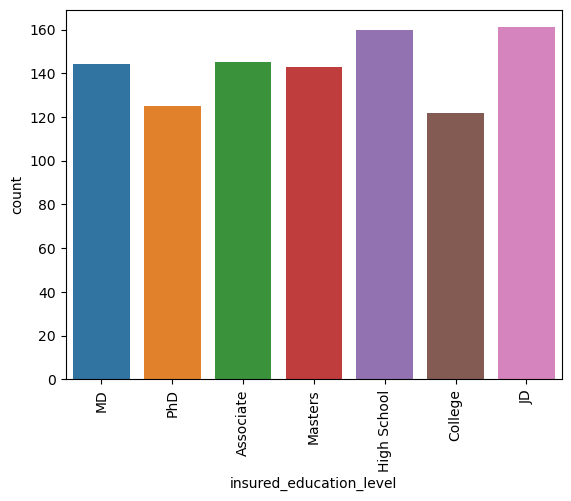

In [34]:
# Plot distribution of insured_education_level
df['insured_education_level'].value_counts()
sns.countplot(x='insured_education_level', data=df)
plt.xticks(rotation=90)
plt.show()

- Majority of the People who are educated have either completed High school studies or JD. 

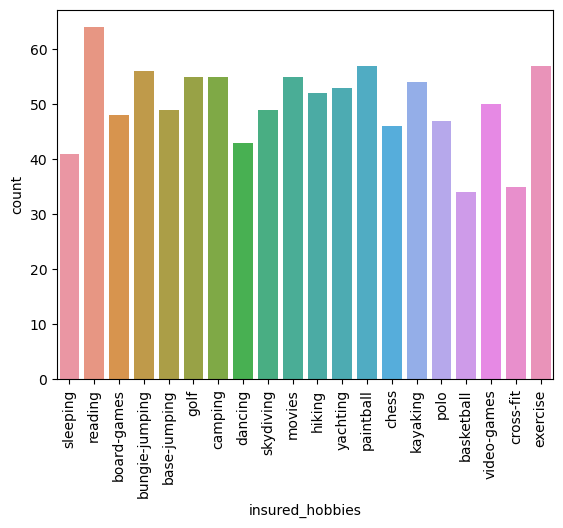

In [35]:
# Plot distribution of insured_hobbies
df['insured_hobbies'].value_counts()
sns.countplot(x='insured_hobbies', data=df)
plt.xticks(rotation=90)
plt.show()

- Majority of the People who were had the hobby of reading. 

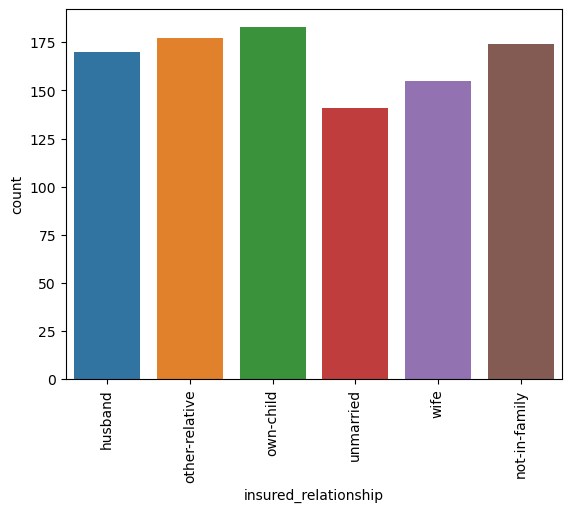

In [36]:
# Plot distribution of insured_relationship
df['insured_relationship'].value_counts()
sns.countplot(x='insured_relationship', data=df)
plt.xticks(rotation=90)
plt.show()

- Majority of the people insured were the only child to their parents hense they were insured. 

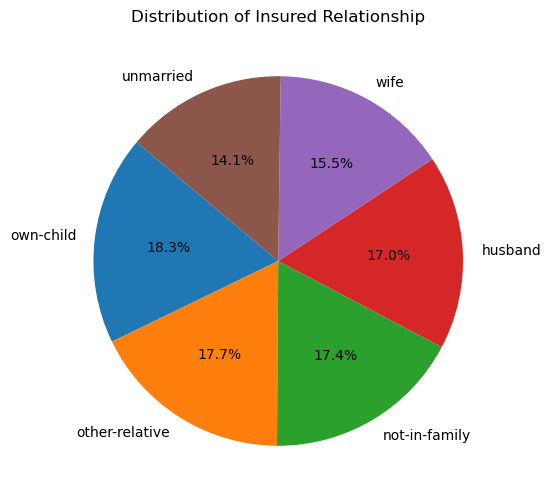

In [37]:
# Calculate the value counts for insured_relationship
relationship_counts = df['insured_relationship'].value_counts()

# Plot the distribution as a pie chart
plt.figure(figsize=(10, 6))
plt.pie(relationship_counts, labels=relationship_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Insured Relationship')
plt.show()

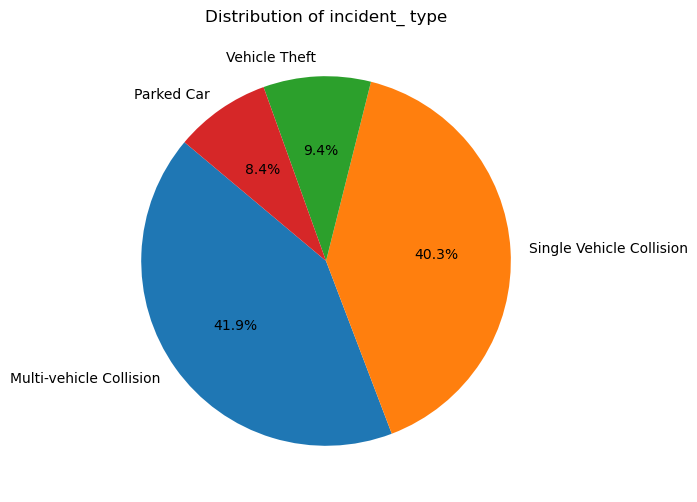

In [38]:
# Calculate the value counts for incident_type
incident_type = df['incident_type'].value_counts()

# Plot the distribution as a pie chart
plt.figure(figsize=(10, 6))
plt.pie(incident_type, labels=incident_type.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of incident_ type')
plt.show()

- Majority of accidents seems to be highest with Multi-vehicle collision followed by single-vehicle collision. 

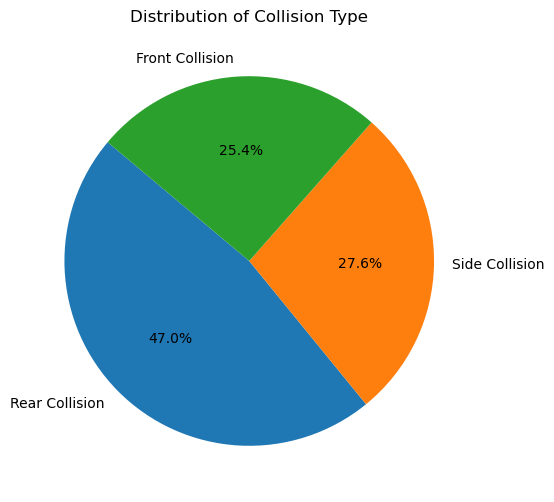

In [39]:
# Calculate the value counts for collision_type
collision_type = df['collision_type'].value_counts()

# Plot the distribution as a pie chart
plt.figure(figsize=(10, 6))
plt.pie(collision_type, labels=collision_type.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Collision Type')
plt.show()

- Maximum collision happed due to Rear collision

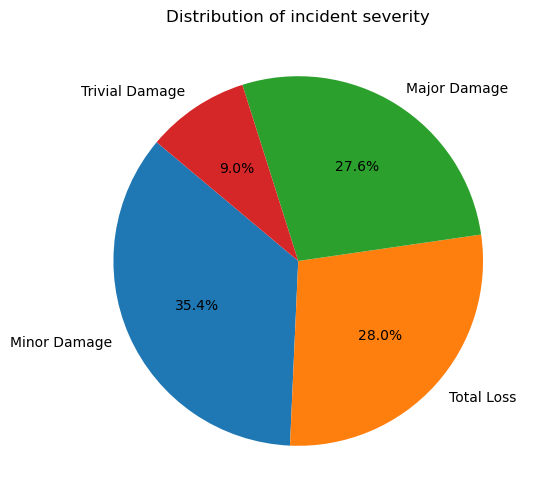

In [40]:
# Calculate the value counts for incident_severity
incident_severity = df['incident_severity'].value_counts()

# Plot the distribution as a pie chart
plt.figure(figsize=(10, 6))
plt.pie(incident_severity, labels=incident_severity.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of incident severity')
plt.show()

- In most of the cases it was found that there was a minor damage. but 28.0% reported to have total loss

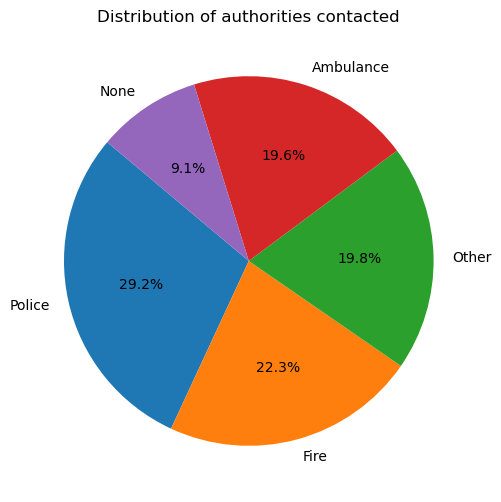

In [41]:
# Calculate the value counts for authorities_contacted
authorities_contacted = df['authorities_contacted'].value_counts()

# Plot the distribution as a pie chart
plt.figure(figsize=(10, 6))
plt.pie(authorities_contacted, labels=authorities_contacted.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of authorities contacted')
plt.show()

- Police were the most popular authority to be contacted post incidents. Fire and ambulance were also called for severe incidents if needed. 

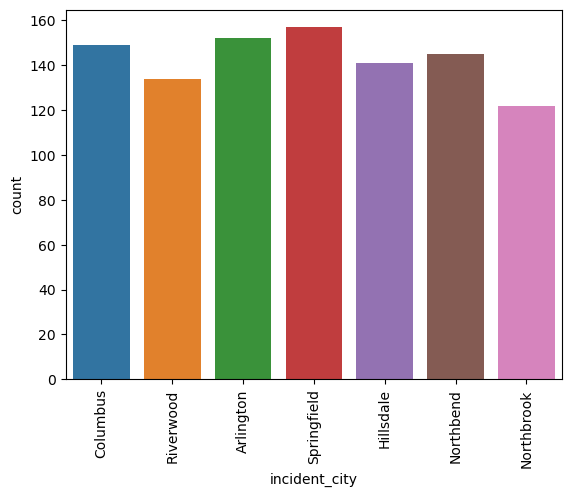

In [42]:
# Plot distribution of incident_city
df['incident_city'].value_counts()
sns.countplot(x='incident_city', data=df)
plt.xticks(rotation=90)
plt.show()

- Most of the claims were reported from Springfield followed by Arlington. 

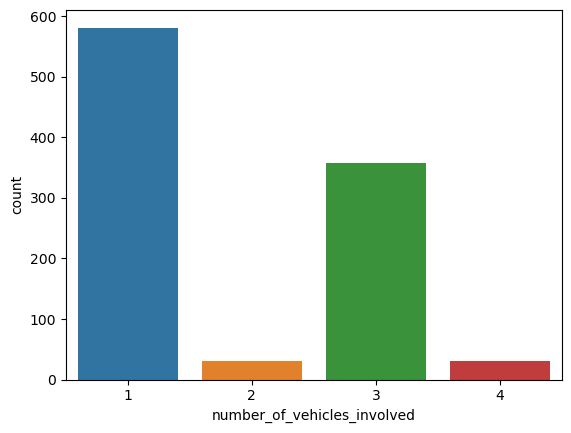

In [43]:
# Plot distribution of number_of_vehicles_involved
df['number_of_vehicles_involved'].value_counts()
sns.countplot(x='number_of_vehicles_involved', data=df)
plt.show()

- In most of the cases on 1 vehicle was involved during incidents. 

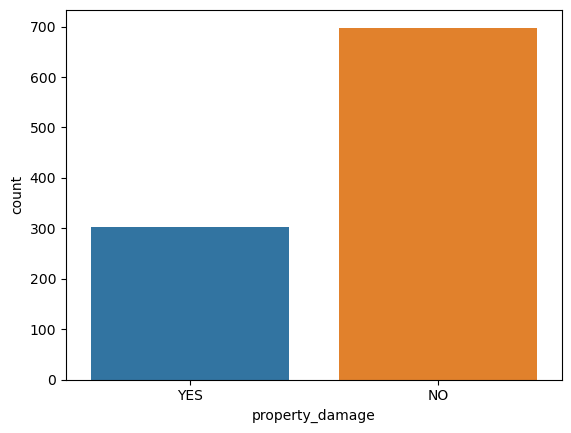

In [44]:
# Plot distribution of property_damage
df['property_damage'].value_counts()
sns.countplot(x='property_damage', data=df)
plt.show()

- In most of the cases property was not damaged. 

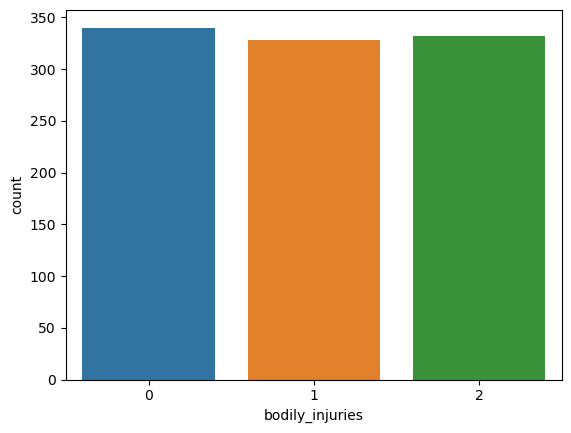

In [45]:
# Plot distribution of bodily_injuries
df['bodily_injuries'].value_counts()
sns.countplot(x='bodily_injuries', data=df)
plt.show()

- Most of the cases there were no Bodily injuries. But there was slight differnece between no body injuey to 1 or 2 body injuries. 

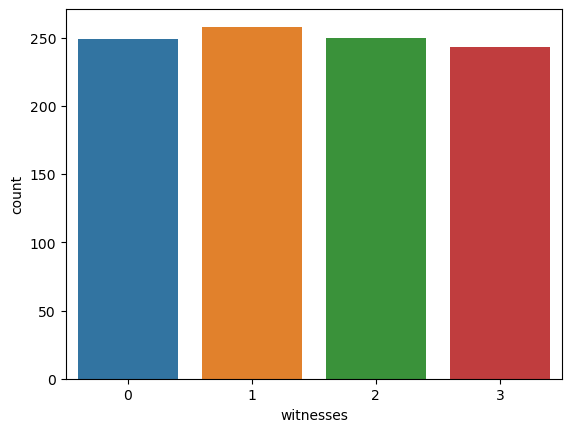

In [46]:
# Plot distribution of witnesses
df['witnesses'].value_counts()
sns.countplot(x='witnesses', data=df)
plt.show()

- In most of the cases there was 1 witness. 

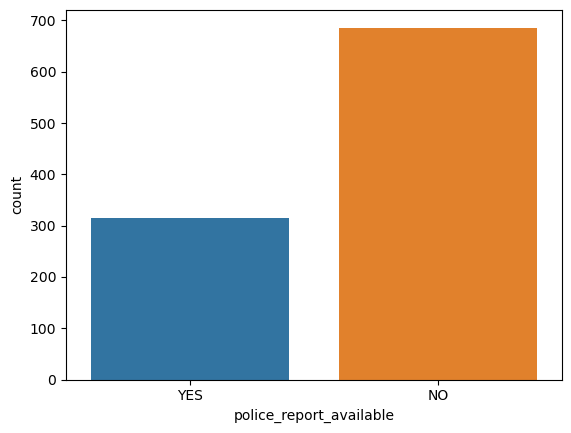

In [47]:
# Plot distribution of police_report_available
df['police_report_available'].value_counts()
sns.countplot(x='police_report_available', data=df)
plt.show()

- Majority of the cases there was no Police report available. This may be because of the Minor accidents. 

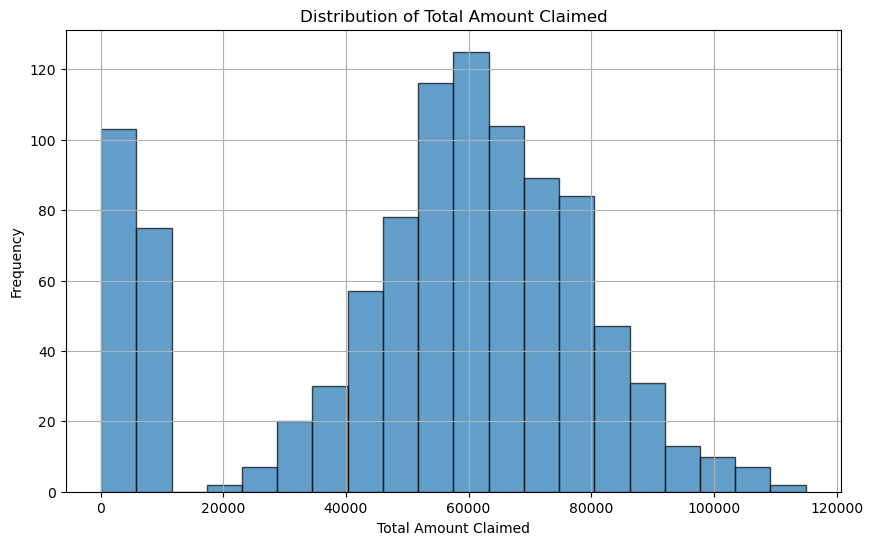

In [48]:
# Plot a histogram to visualize the distribution of total_claim_amount 
plt.figure(figsize=(10, 6))
plt.hist(df['total_claim_amount'], bins=20, edgecolor='k', alpha=0.7)
plt.title('Distribution of Total Amount Claimed')
plt.xlabel('Total Amount Claimed')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [49]:
# Find the maximum and minimum total_claim_amount
max_claim = df['total_claim_amount'].max()
min_claim = df['total_claim_amount'].min()

print(f"The maximum total amount claimed is: ${max_claim}")
print(f"The minimum total amount claimed is: ${min_claim}")

The maximum total amount claimed is: $114920
The minimum total amount claimed is: $100


In [50]:
# Find the most frequent total_claim_amount
most_frequent_claim_amount = df['total_claim_amount'].mode()[0]

print(f"The most frequent total claim amount is: ${most_frequent_claim_amount}")

The most frequent total claim amount is: $59400


#### The maximum amount claimed is between 55000-65000. 

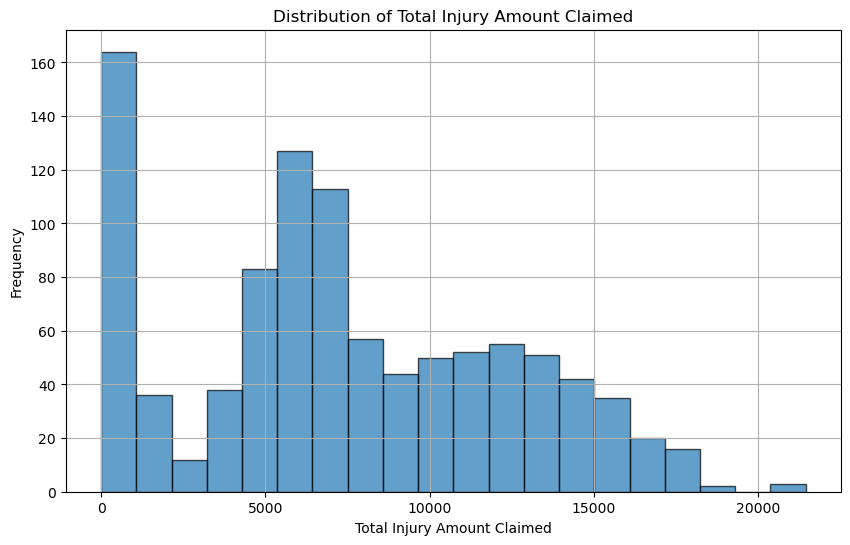

In [51]:
# Plot a histogram to visualize the distribution of injury_claim 
plt.figure(figsize=(10, 6))
plt.hist(df['injury_claim'], bins=20, edgecolor='k', alpha=0.7)
plt.title('Distribution of Total Injury Amount Claimed')
plt.xlabel('Total Injury Amount Claimed')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [52]:
# Find the maximum and minimum total_claim_amount
max_claim = df['injury_claim'].max()
min_claim = df['injury_claim'].min()

# Find the most frequent total_claim_amount
most_frequent_claim_amount = df['injury_claim'].mode()[0]

print(f"The most frequent total claim amount is: ${most_frequent_claim_amount}")
print(f"The maximum total amount claimed is: ${max_claim}")
print(f"The minimum total amount claimed is: ${min_claim}")

The most frequent total claim amount is: $0
The maximum total amount claimed is: $21450
The minimum total amount claimed is: $0


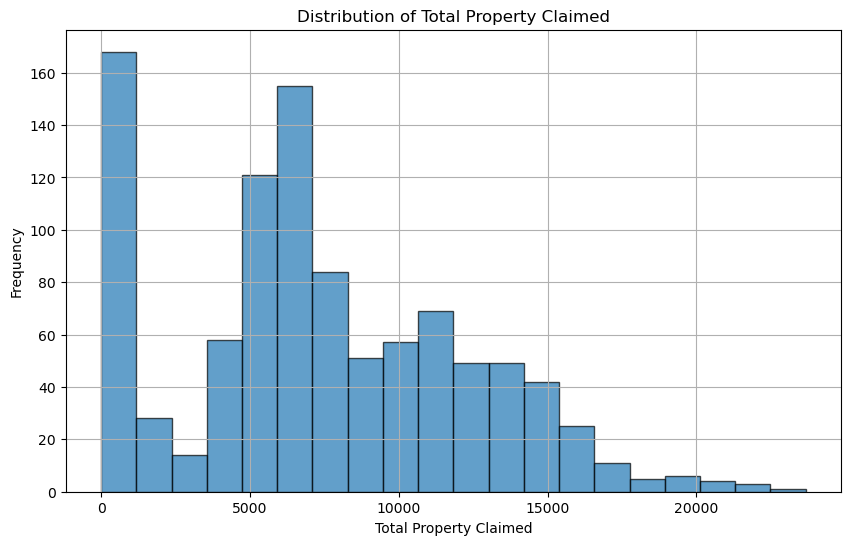

In [53]:
# Plot a histogram to visualize the distribution of property_claim 
plt.figure(figsize=(10, 6))
plt.hist(df['property_claim'], bins=20, edgecolor='k', alpha=0.7)
plt.title('Distribution of Total Property Claimed')
plt.xlabel('Total Property Claimed')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [54]:
# Find the maximum and minimum total_property_claim_amount
max_claim = df['property_claim'].max()
min_claim = df['property_claim'].min()

# Find the most frequent total_claim_amount
most_frequent_claim_amount = df['property_claim'].mode()[0]

print(f"The most frequent total claim amount is: ${most_frequent_claim_amount}")
print(f"The maximum total amount claimed is: ${max_claim}")
print(f"The minimum total amount claimed is: ${min_claim}")

The most frequent total claim amount is: $0
The maximum total amount claimed is: $23670
The minimum total amount claimed is: $0


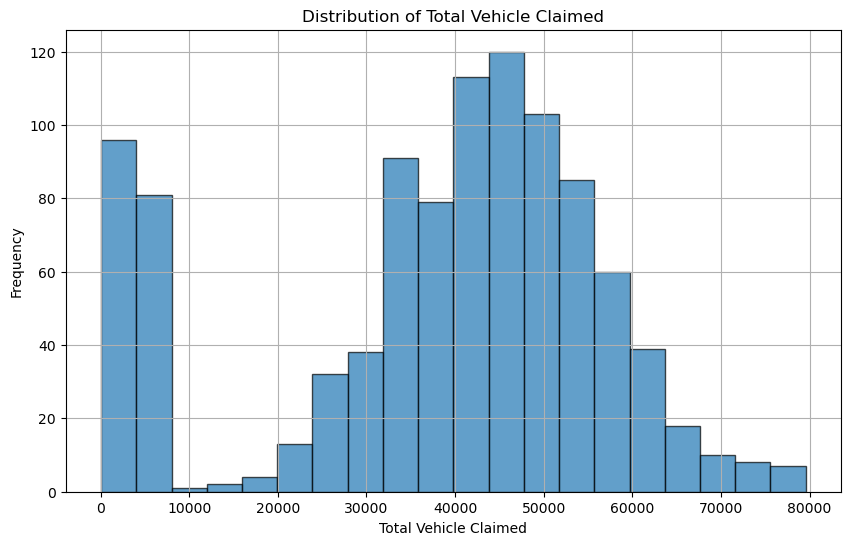

In [55]:
# Plot a histogram to visualize the distribution of vehicle_claim 
plt.figure(figsize=(10, 6))
plt.hist(df['vehicle_claim'], bins=20, edgecolor='k', alpha=0.7)
plt.title('Distribution of Total Vehicle Claimed')
plt.xlabel('Total Vehicle Claimed')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [56]:
# Find the maximum and minimum vehicle_claim
max_claim = df['vehicle_claim'].max()
min_claim = df['vehicle_claim'].min()

# Find the most frequent total_claim_amount
most_frequent_claim_amount = df['vehicle_claim'].mode()[0]

print(f"The most frequent total claim amount is: ${most_frequent_claim_amount}")
print(f"The maximum total amount claimed is: ${max_claim}")
print(f"The minimum total amount claimed is: ${min_claim}")

The most frequent total claim amount is: $5040
The maximum total amount claimed is: $79560
The minimum total amount claimed is: $70


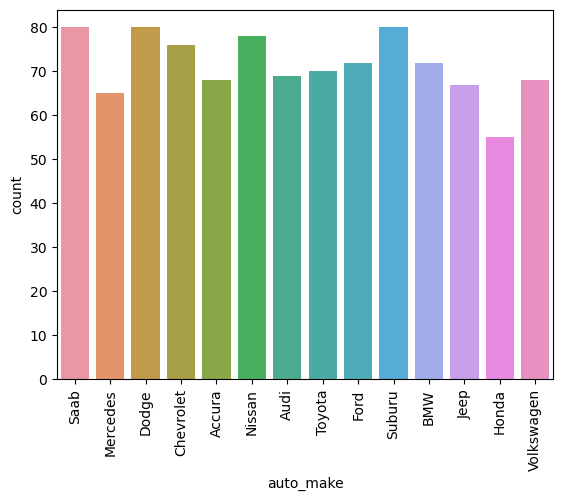

In [57]:
# Plot distribution of auto_make
df['auto_make'].value_counts()
sns.countplot(x='auto_make', data=df)
plt.xticks(rotation=90)
plt.show()

- The Maximum auto-make claimed are Saab, Dodge, Suburu followed by Nissan. 

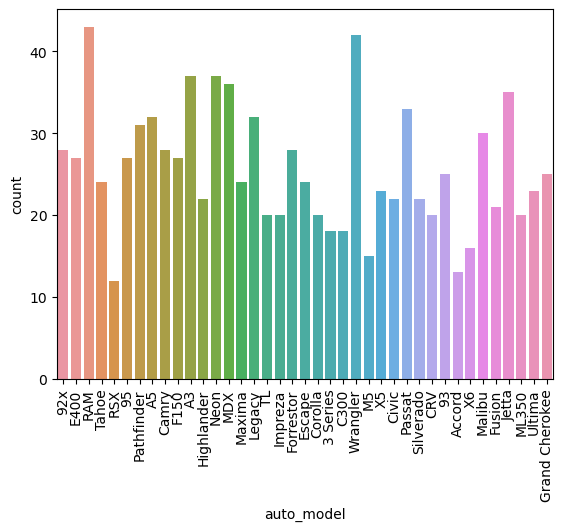

In [58]:
# Plot distribution of auto_model
df['auto_model'].value_counts()
sns.countplot(x='auto_model', data=df)
plt.xticks(rotation=90)
plt.show()

- The frequent Auto model in claims were RAM, Wrangler

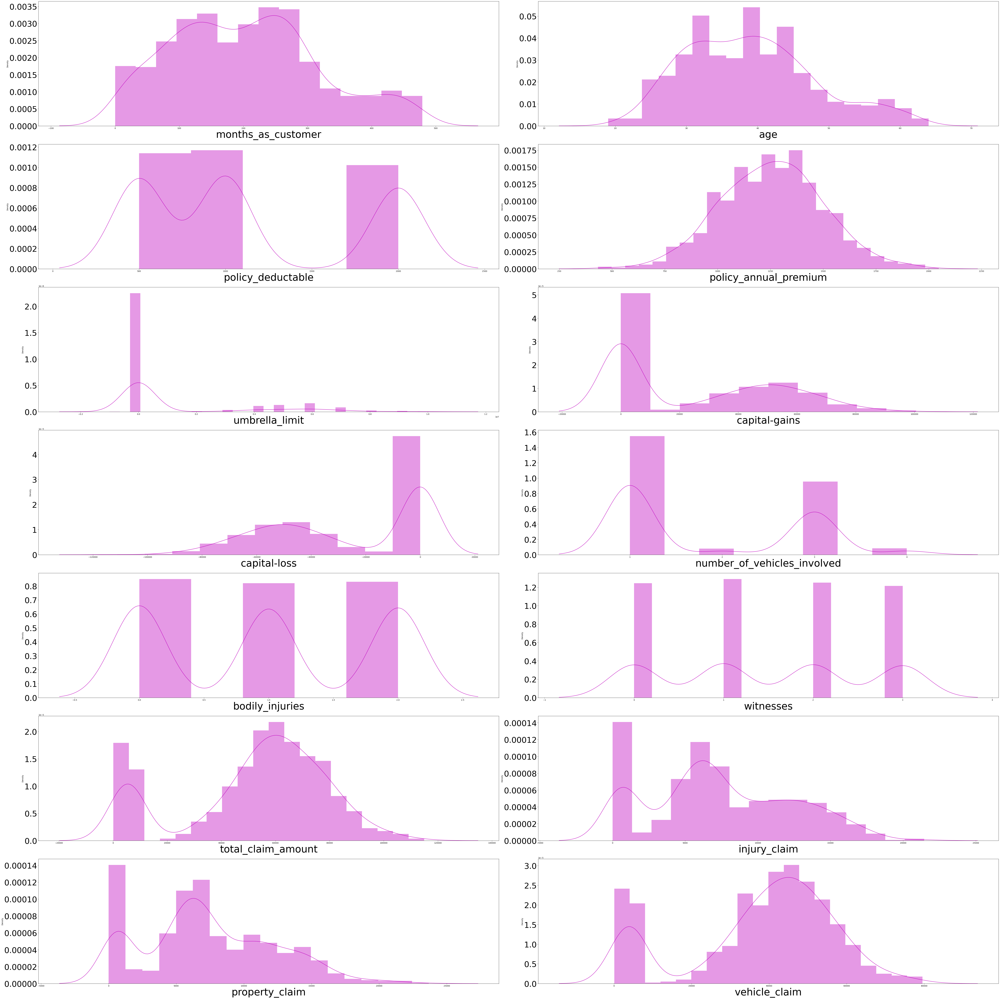

In [59]:
#Letss check how data is disctributed in numerical columns
plt.figure(figsize = (70,70), facecolor="white")
plotnumber= 1
for col in numerical_col:
    if plotnumber<=14:
        ax = plt.subplot (7,2,plotnumber)
        sns.distplot (df[col],color='m')
        plt.xlabel(col,fontsize= 50 )
        plt.yticks(rotation=0,fontsize=40)
    plotnumber+=1
plt.tight_layout()

#### OBSERVATION:
1. Umbrella_limit, capital_gains, number_of_vehicles_invloved have right skewed data.
2. Capital_loss, total_claim_amount, vehicle_claim have left skewed data. 
3. Rest all the columns are evenly distributed. 

## Bivariate Analysis

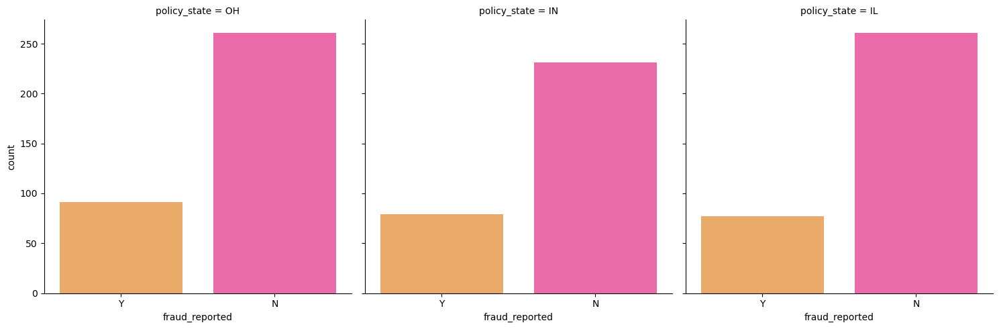

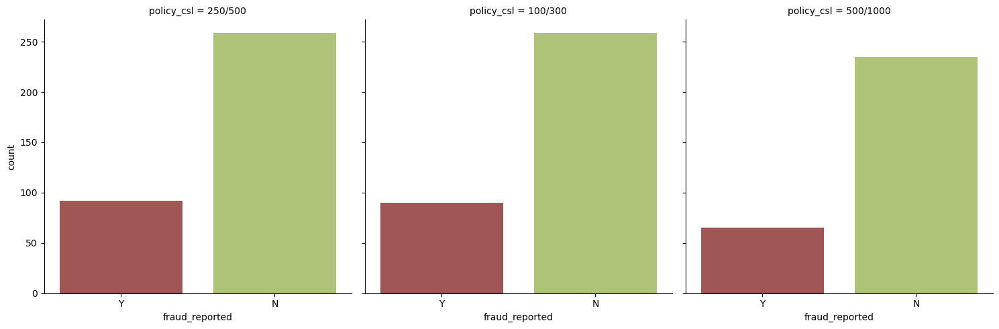

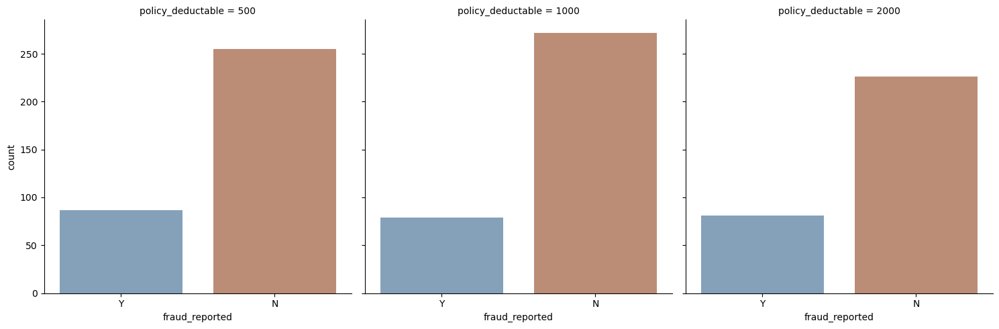

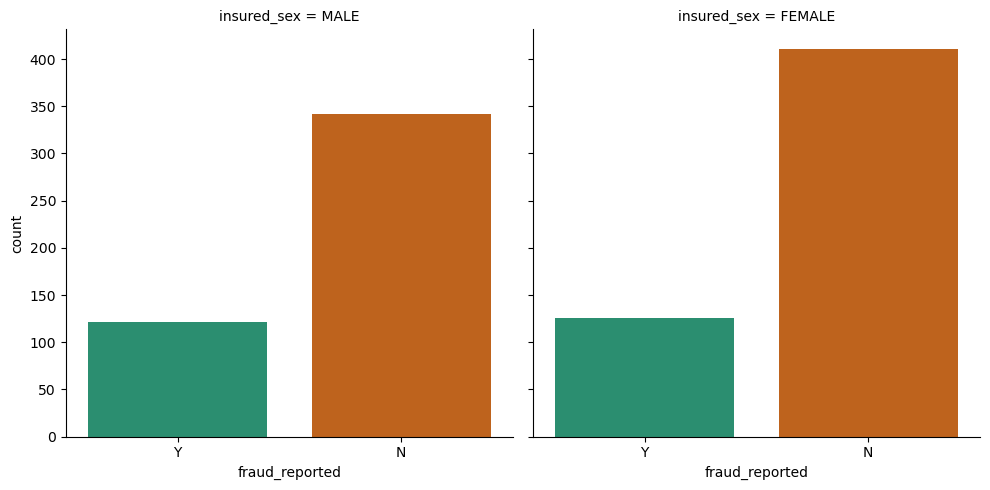

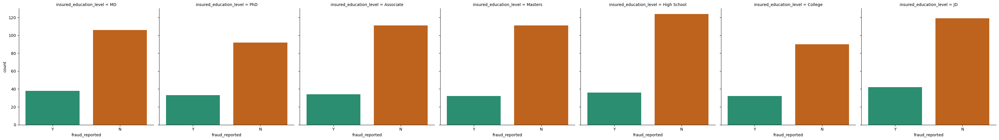

...

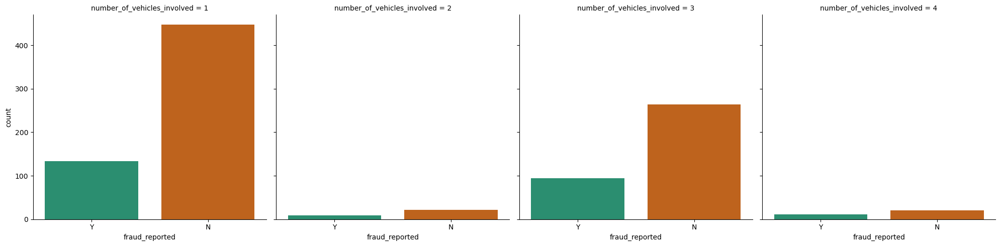

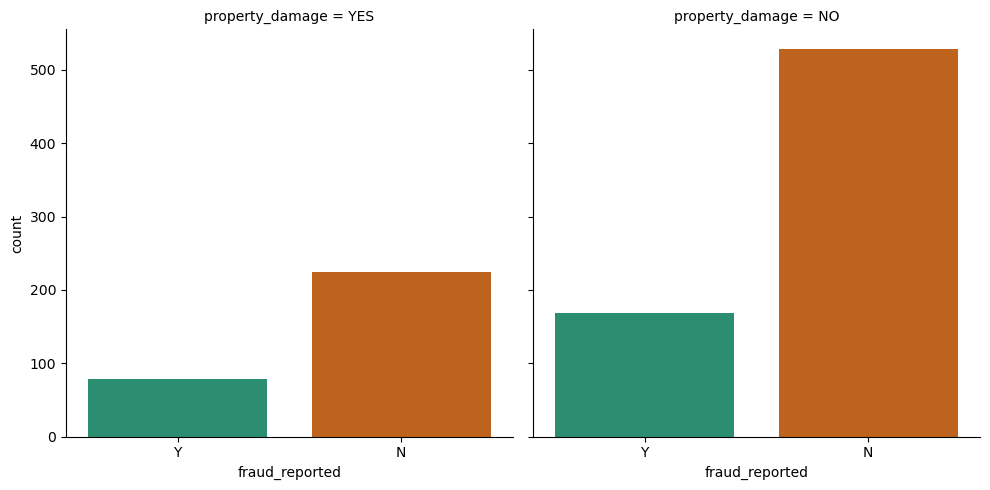

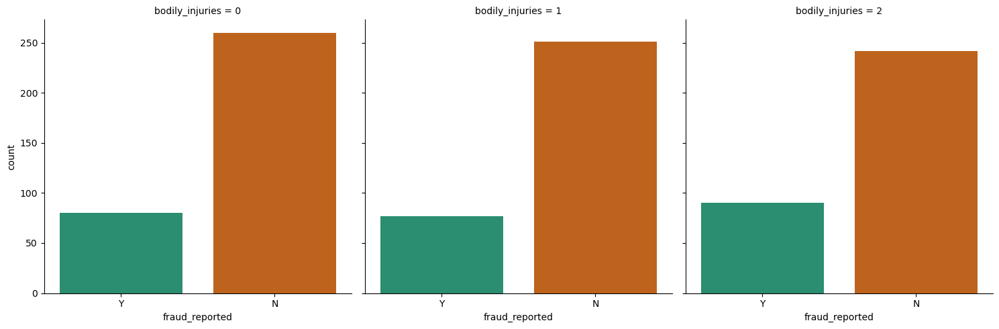

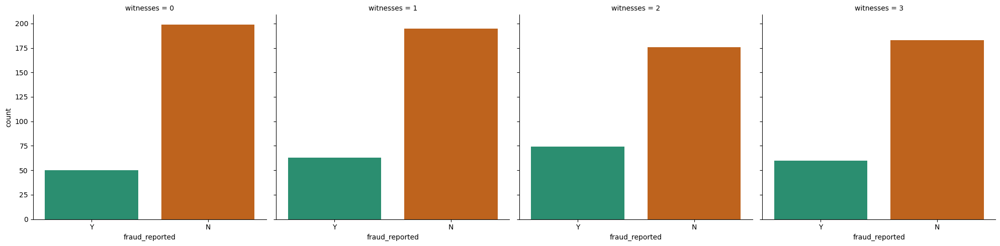

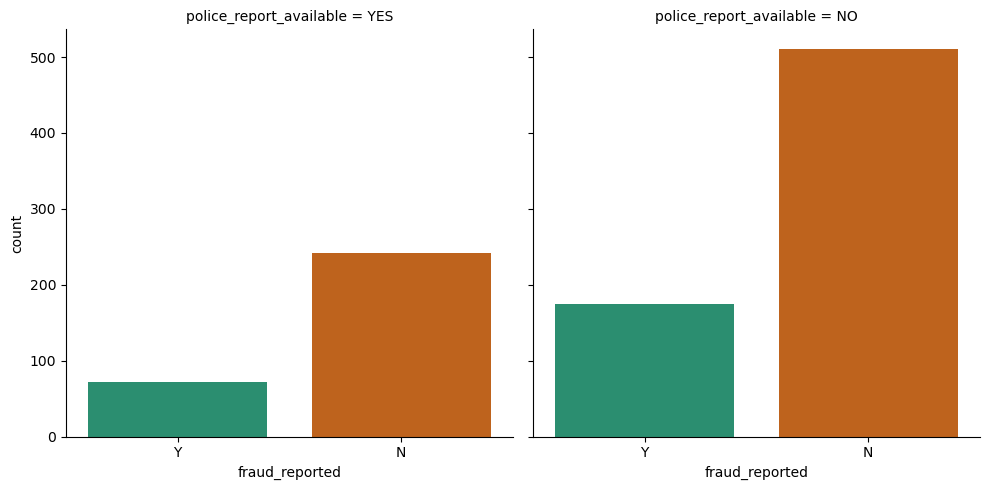

In [60]:
#checking fraud_reported and policy_state
sns.catplot (x="fraud_reported", col="policy_state",data=df, kind="count",palette='spring_r')

#checking fraud_reported,and policy_csl
sns.catplot (x="fraud_reported", col="policy_csl",data=df, kind="count",palette='tab20b_r')

#checking fraud_reported in policy_deductable
sns.catplot (x="fraud_reported", col="policy_deductable",data=df, kind="count",palette='twilight_shifted')

#checking fraud_reported in insured_sex
sns.catplot (x="fraud_reported", col="insured_sex",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in insured_education_level
sns.catplot (x="fraud_reported", col="insured_education_level",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in insured_relationship
sns.catplot (x="fraud_reported", col="insured_relationship",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in incident_type
sns.catplot (x="fraud_reported", col="incident_type",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in collision_type
sns.catplot (x="fraud_reported", col="collision_type",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in incident_severity
sns.catplot (x="fraud_reported", col="incident_severity",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in number_of_vehicles_involved
sns.catplot (x="fraud_reported", col="number_of_vehicles_involved",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in property_damage
sns.catplot (x="fraud_reported", col="property_damage",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in bodily_injuries
sns.catplot (x="fraud_reported", col="bodily_injuries",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in witnesses
sns.catplot (x="fraud_reported", col="witnesses",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in police_report_available
sns.catplot (x="fraud_reported", col="police_report_available",data=df, kind="count",palette='Dark2')
plt.show()

## OBSERVATIONS:

#### In all the cases Fraud cases are less than Non-fraud cases. 

1. In policy_state=IN fraud_reported were lesser than other policy_state. 
2. Policy_csl reported less number of fraud reports. 
3. Fraud_reported for policy_deductable=1000 and policy_deductable=1000 is lesser. 
4. Fraud reported for both males and females are in same range. 
5. More case of fraud were reported for Insured_eductaion_level of MD and JD. 
6. Fraud Report cases for insured_relationship=other relation are more compared to others. 
7. More fraud cases were reported for a Single vehicle Collision.
8. More Fraud cases were reported for the incidents with rear collision.But number of fraud cases were lesser than Non-fraud cases. 
9. In case of Major damage More fraudd cases were registered than non fraud cases. Whereas in Trivial damage very less of fraud were registered.
10. For cases where only 1 vehicle was involved fraud cases are more than other number of vehicles involved. 
11. We can observe that where no damage happened to them property , fraud cases were registered in high number. 
12. It is observed that fraud cases are more registered for cases where policy report is not available. 

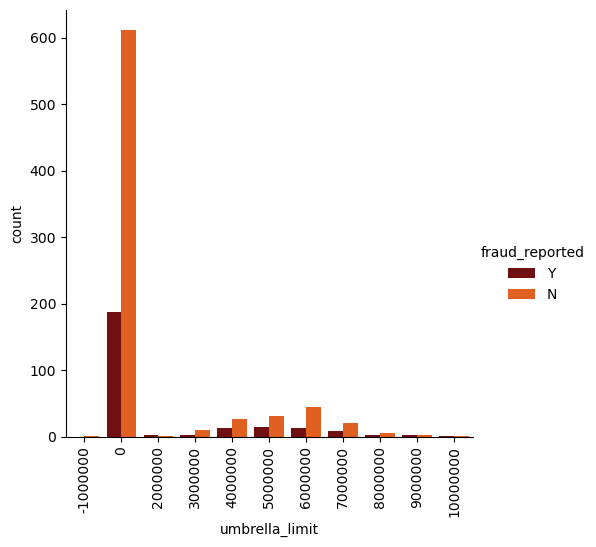

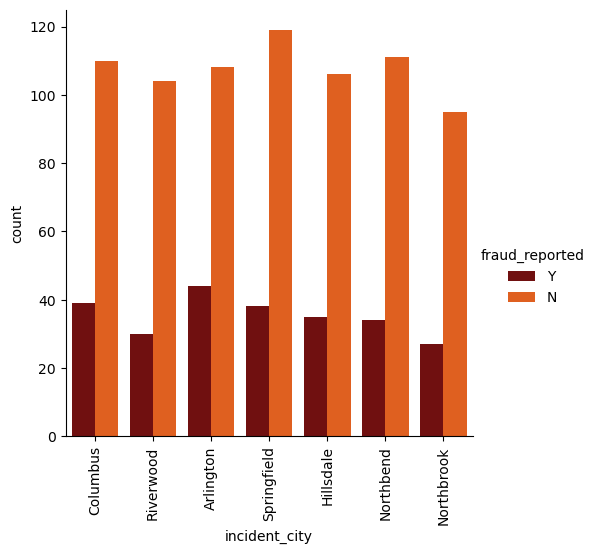

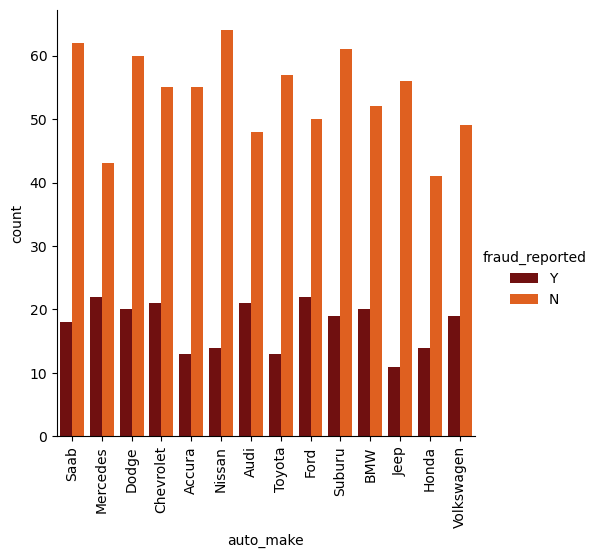

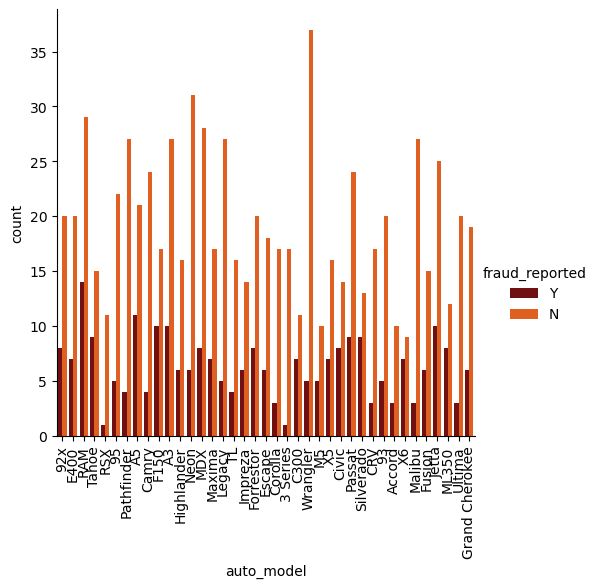

In [61]:
#checking fraud_reported in umbrella_limit
sns.catplot (x="umbrella_limit",hue='fraud_reported', data=df, kind="count",palette='gist_heat')
plt.xticks(rotation=90)
plt.show()

#checking fraud_reported in incident_city
sns.catplot (x="incident_city",hue='fraud_reported', data=df, kind="count",palette='gist_heat')
plt.xticks(rotation=90)
plt.show()

#checking fraud_reported in auto_make
sns.catplot (x="auto_make",hue='fraud_reported', data=df, kind="count",palette='gist_heat')
plt.xticks(rotation=90)
plt.show()

#checking fraud_reported in auto_model
sns.catplot (x="auto_model",hue='fraud_reported', data=df, kind="count",palette='gist_heat')
plt.xticks(rotation=90)
plt.show()

# Descriptive Statistics 

In [62]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,25126.100000,-26793.700000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,27872.187708,28104.096686,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,0.000000,-111100.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,0.000000,-51500.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,0.000000,-23250.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,51025.000000,0.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,100500.000000,0.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000


### OBSERVATIONS:
1. Mean is greater than Median for months_as_customer, policy_deductable, capital gain, injury_claim, property_claim. For those columns the data is right skewed. 
2. For the columns vehicle_claim,total_claim_amount, incident_hour_of_the_day,capital-loss,policy_annual_premium mean is smaller than median. Here the data is left skewed. 
3. For almost all the columns we find a huge difference in Max and Quartile 3. Hense lot of outliers are also present in the data. 

### Multivariate Analysis

<function matplotlib.pyplot.show(close=None, block=None)>

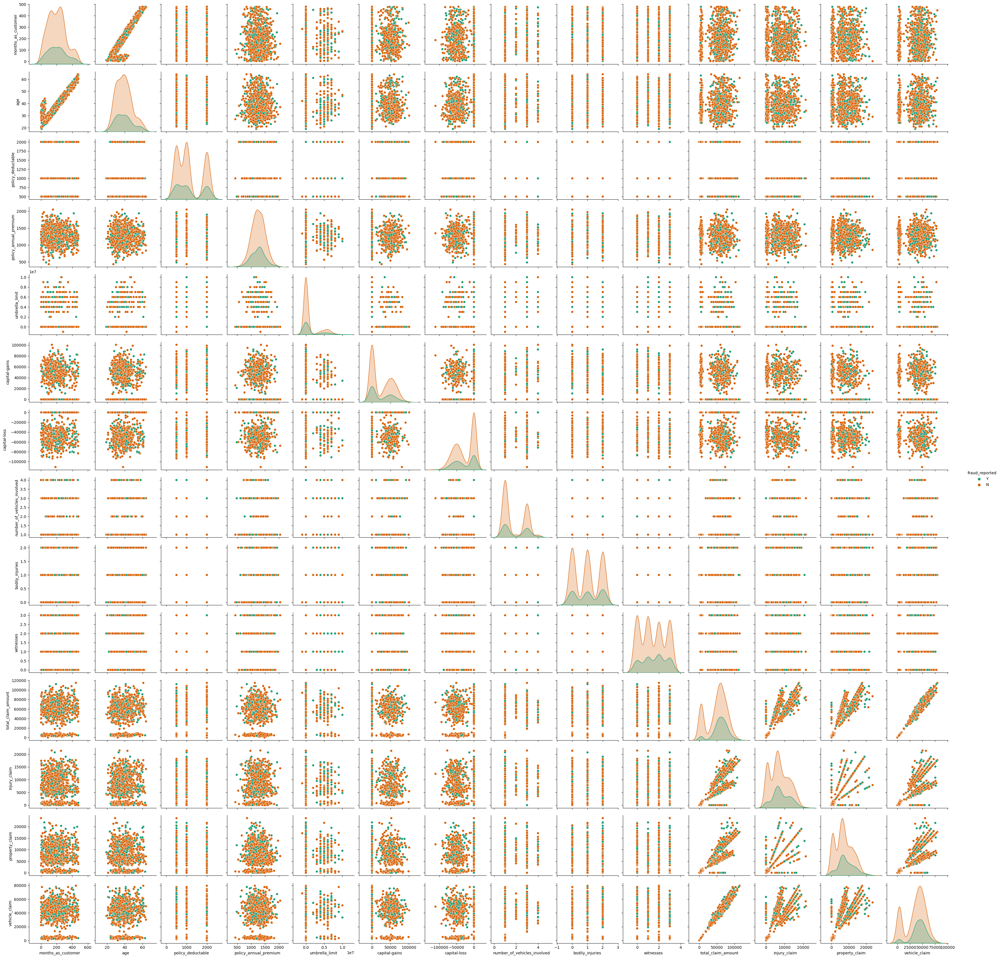

In [63]:
sns.pairplot(df,hue="fraud_reported", palette="Dark2")
plt.show

### Lets convert Categorical data into Numerical data to Analyse further. 

In [64]:
#Encoding categorical column using ordinal Method
from sklearn.preprocessing import OrdinalEncoder
OE=OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=OE.fit_transform(df[i].values.reshape(-1,1))
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
0,328,48,2.0,1.0,1000,1406.91,0,1.0,4.0,2.0,...,1,2,1.0,71610,6510,13020,52080,10.0,1.0,1.0
1,228,42,1.0,1.0,2000,1197.22,5000000,1.0,4.0,6.0,...,0,0,0.0,5070,780,780,3510,8.0,12.0,1.0
2,134,29,2.0,0.0,2000,1413.14,5000000,0.0,6.0,11.0,...,2,3,0.0,34650,7700,3850,23100,4.0,30.0,0.0
3,256,41,0.0,1.0,2000,1415.74,6000000,0.0,6.0,1.0,...,1,2,0.0,63400,6340,6340,50720,3.0,34.0,1.0
4,228,44,0.0,2.0,1000,1583.91,6000000,1.0,0.0,11.0,...,0,1,0.0,6500,1300,650,4550,0.0,31.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2.0,2.0,1000,1310.80,0,0.0,5.0,2.0,...,0,1,0.0,87200,17440,8720,61040,6.0,6.0,0.0
996,285,41,0.0,0.0,1000,1436.79,0,0.0,6.0,9.0,...,2,3,0.0,108480,18080,18080,72320,13.0,28.0,0.0
997,130,34,2.0,1.0,500,1383.49,3000000,0.0,5.0,1.0,...,2,3,1.0,67500,7500,7500,52500,11.0,19.0,0.0
998,458,62,0.0,2.0,2000,1356.92,5000000,1.0,0.0,5.0,...,0,1,1.0,46980,5220,5220,36540,1.0,5.0,0.0


# Finding Correlation

In [65]:
cor=df.corr()
cor

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
months_as_customer,1.000000,0.922098,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.060925,-0.000833,0.009814,...,-0.010162,0.058383,-0.022146,0.062108,0.065329,0.034940,0.061013,0.047655,0.004202,0.020544
age,0.922098,1.000000,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.073337,0.000969,0.017220,...,-0.015679,0.052359,-0.020441,0.069863,0.075522,0.060898,0.062588,0.030410,0.017343,0.012143
policy_state,-0.000328,-0.014533,1.000000,0.001027,0.010033,0.012455,-0.029580,-0.020481,-0.034327,-0.031215,...,0.013384,0.022960,0.069017,-0.006002,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.029432
policy_csl,-0.026819,-0.015185,0.001027,1.000000,0.003384,0.023978,0.021636,-0.010757,0.009153,0.015788,...,-0.000595,0.071500,-0.001645,-0.055758,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.037190
policy_deductable,0.026807,0.029188,0.010033,0.003384,1.000000,-0.003245,0.010870,-0.009733,0.015217,-0.046733,...,-0.022765,0.066639,0.038036,0.022839,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.014817
policy_annual_premium,0.005018,0.014404,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.038853,-0.019715,0.035922,...,0.026780,0.002332,0.021998,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.014480
umbrella_limit,0.015498,0.018126,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.010688,-0.019357,0.023422,...,0.022743,-0.006738,-0.044771,-0.040344,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.058622
insured_sex,0.060925,0.073337,-0.020481,-0.010757,-0.009733,0.038853,0.010688,1.000000,0.009002,-0.006160,...,-0.020297,0.042463,0.006992,-0.023727,0.000924,-0.014868,-0.029609,0.026457,-0.018421,0.030873
insured_education_level,-0.000833,0.000969,-0.034327,0.009153,0.015217,-0.019715,-0.019357,0.009002,1.000000,-0.020298,...,-0.012072,0.019211,0.051640,0.074226,0.081880,0.055794,0.068348,0.055202,0.049445,0.008808
insured_occupation,0.009814,0.017220,-0.031215,0.015788,-0.046733,0.035922,0.023422,-0.006160,-0.020298,1.000000,...,-0.000236,-0.014794,-0.025232,0.003692,0.020211,0.003004,-0.000829,0.042621,0.020584,0.001564


<Axes: >

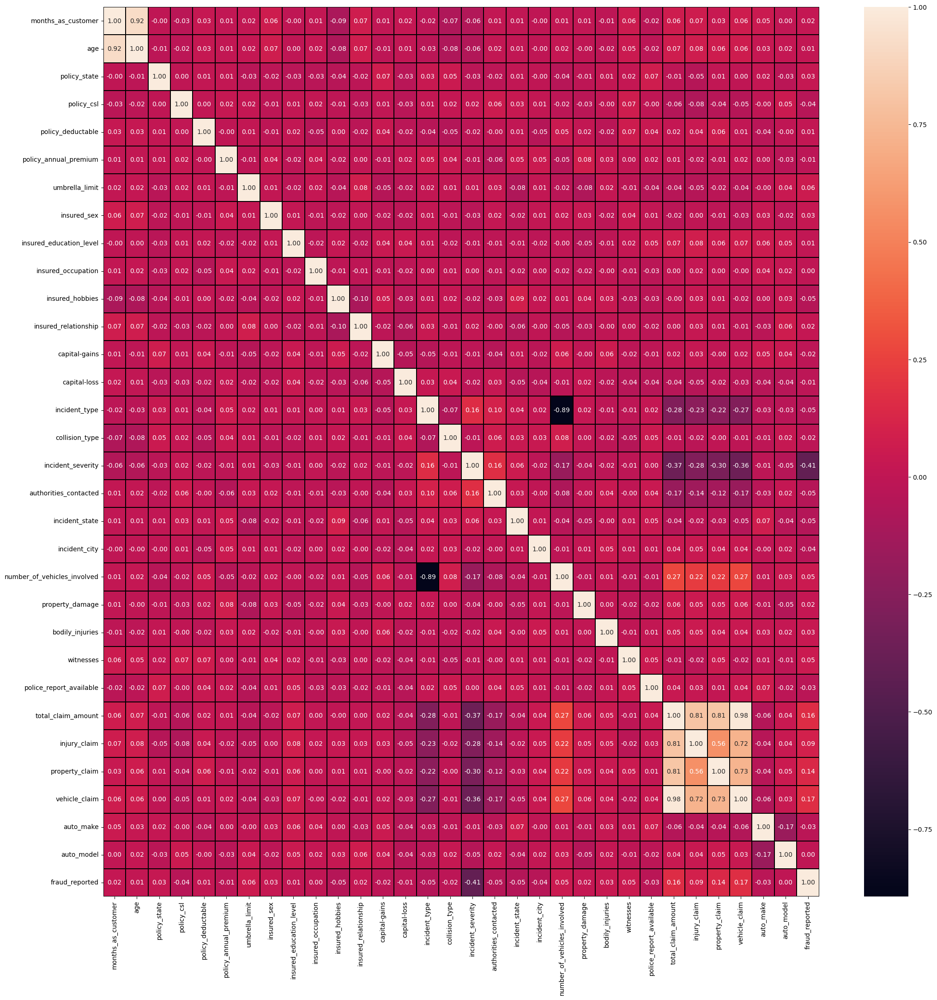

In [66]:
plt.figure(figsize=(25,25))
sns.heatmap(df.corr(),annot=True,linewidths=0.1,linecolor="black",fmt='0.2f')

#### OBSERVATIONS:
1. Number of vehicles involved is highly correlated to incident_type
2. Total Claim amount, injury_claim, property_claim, and vehicle_claim are highly correlated to reach other. 

In [67]:
#Finding correlation of features with the target variable Loan_Status
cor["fraud_reported"].sort_values(ascending=True)

incident_severity             -0.405988
incident_state                -0.051407
incident_type                 -0.050376
insured_hobbies               -0.046838
authorities_contacted         -0.045802
incident_city                 -0.040403
policy_csl                    -0.037190
police_report_available       -0.027768
auto_make                     -0.027519
capital-gains                 -0.019173
collision_type                -0.017315
capital-loss                  -0.014863
policy_annual_premium         -0.014480
auto_model                     0.000720
insured_occupation             0.001564
insured_education_level        0.008808
age                            0.012143
policy_deductable              0.014817
property_damage                0.017202
months_as_customer             0.020544
insured_relationship           0.021043
policy_state                   0.029432
insured_sex                    0.030873
bodily_injuries                0.033877
witnesses                      0.049497


#### OBSERVATIONS:
Target variable donot have much correlation with features. 

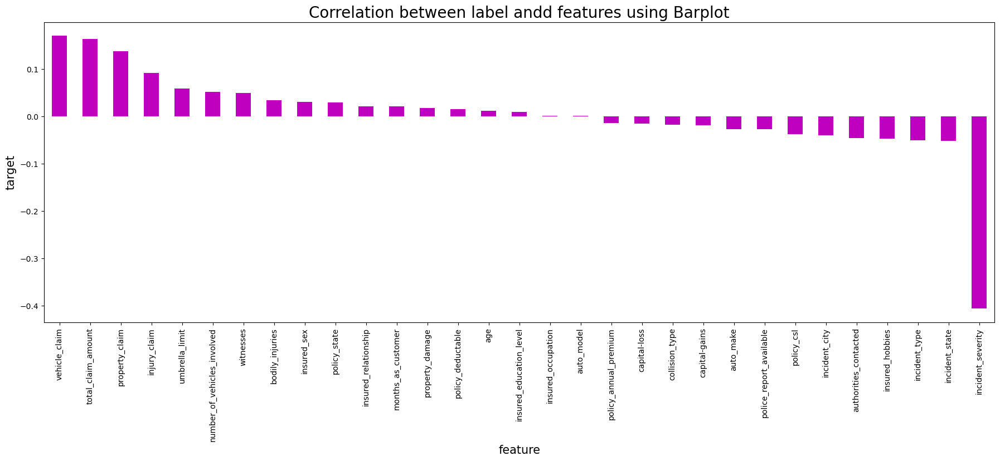

In [68]:
#visualizing correlation between Features and Target by bar plot
plt.figure(figsize=(22,7))
df.corr()["fraud_reported"].sort_values(ascending=False).drop(["fraud_reported"]).plot(kind='bar',color="m")
plt.xlabel("feature",fontsize=15)
plt.ylabel("target",fontsize=15)
plt.title("Correlation between label andd features using Barplot", fontsize=20)
plt.show()

- only incidenrt_severity has modertaee correlation with the Target fraud_reported

# Findling Outliers:

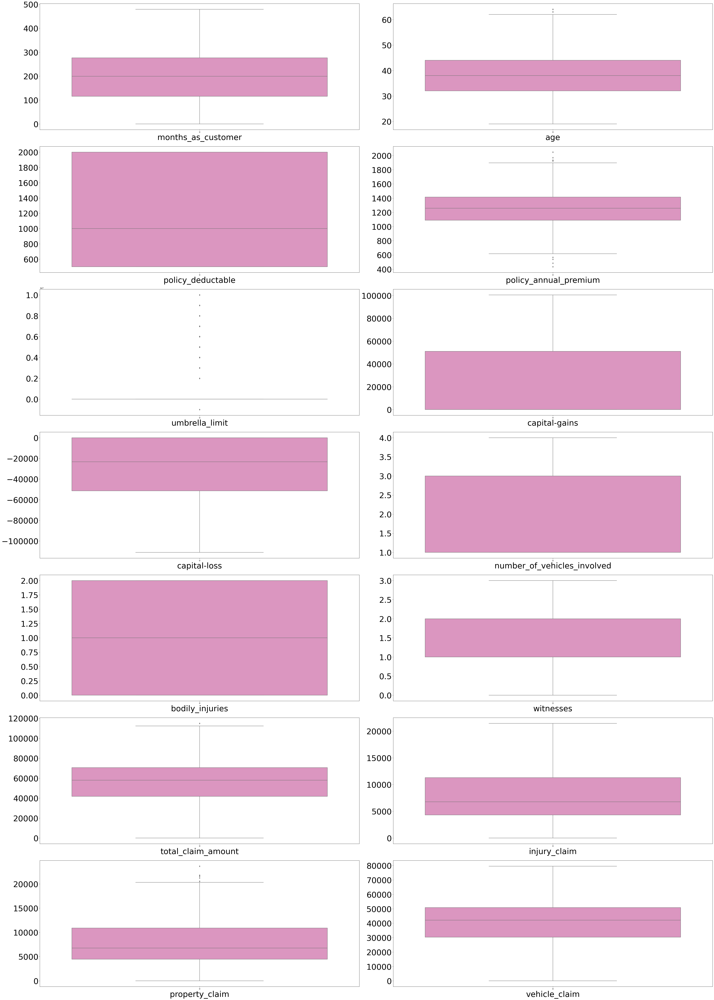

In [69]:
#checking outliers by Boxplot
plt.figure(figsize = (50,70), facecolor="white")
plotnumber= 1
for col in numerical_col:
    if plotnumber<=14:
        ax = plt.subplot (7,2,plotnumber)
        sns.boxplot (df[col],palette='Set2_r')
        plt.xlabel(col,fontsize= 40 )
        plt.yticks(rotation=0,fontsize=40)
    plotnumber+=1
plt.tight_layout()

- Policy annual premium, umbrella limit,property_claim has outliers, and we need to treat the outliers.  

# Removal of Outliers

In [70]:
#Treating outliers with Z-score method
from scipy.stats import zscore
import numpy as np
z=np.abs(zscore(df))
threshold=3
np.where(z>3)

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
        657, 700, 763, 807, 875, 922, 975], dtype=int64),
 array([ 6,  6,  6,  6,  6,  5,  5,  6,  6,  6,  6, 27,  6,  6,  6,  5, 13,
         6,  6,  6], dtype=int64))

In [71]:
df1=df[(z<3).all(axis=1)]
df1

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
0,328,48,2.0,1.0,1000,1406.91,0,1.0,4.0,2.0,...,1,2,1.0,71610,6510,13020,52080,10.0,1.0,1.0
1,228,42,1.0,1.0,2000,1197.22,5000000,1.0,4.0,6.0,...,0,0,0.0,5070,780,780,3510,8.0,12.0,1.0
2,134,29,2.0,0.0,2000,1413.14,5000000,0.0,6.0,11.0,...,2,3,0.0,34650,7700,3850,23100,4.0,30.0,0.0
3,256,41,0.0,1.0,2000,1415.74,6000000,0.0,6.0,1.0,...,1,2,0.0,63400,6340,6340,50720,3.0,34.0,1.0
4,228,44,0.0,2.0,1000,1583.91,6000000,1.0,0.0,11.0,...,0,1,0.0,6500,1300,650,4550,0.0,31.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2.0,2.0,1000,1310.80,0,0.0,5.0,2.0,...,0,1,0.0,87200,17440,8720,61040,6.0,6.0,0.0
996,285,41,0.0,0.0,1000,1436.79,0,0.0,6.0,9.0,...,2,3,0.0,108480,18080,18080,72320,13.0,28.0,0.0
997,130,34,2.0,1.0,500,1383.49,3000000,0.0,5.0,1.0,...,2,3,1.0,67500,7500,7500,52500,11.0,19.0,0.0
998,458,62,0.0,2.0,2000,1356.92,5000000,1.0,0.0,5.0,...,0,1,1.0,46980,5220,5220,36540,1.0,5.0,0.0


In [72]:
#Using IQR Method
from scipy import stats
IQR = stats.iqr(df)
IQR

40.0

In [73]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)

In [74]:
df2 = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]
df2

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
7,165,37,0.0,0.0,1000,1137.03,0,1.0,0.0,12.0,...,2,2,1.0,51590,9380,9380,32830,1.0,5.0,0.0
9,212,42,0.0,0.0,500,1315.68,0,1.0,6.0,8.0,...,2,1,0.0,42300,4700,4700,32900,10.0,1.0,0.0
34,149,37,0.0,2.0,500,1415.68,0,1.0,6.0,9.0,...,0,1,1.0,64800,10800,5400,48600,1.0,4.0,0.0
39,199,37,1.0,1.0,500,1262.08,0,1.0,3.0,12.0,...,0,3,0.0,60170,10940,10940,38290,9.0,29.0,1.0
71,222,41,2.0,0.0,2000,1055.53,0,0.0,4.0,1.0,...,0,2,0.0,61290,6810,6810,47670,6.0,10.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929,136,32,1.0,0.0,500,1169.62,0,0.0,3.0,11.0,...,0,0,0.0,55000,10000,10000,35000,12.0,9.0,1.0
954,246,39,1.0,1.0,1000,1416.08,0,0.0,3.0,2.0,...,0,3,0.0,45180,5020,5020,35140,6.0,8.0,0.0
973,230,37,0.0,2.0,1000,1060.74,0,1.0,6.0,12.0,...,2,3,0.0,49100,9820,4910,34370,11.0,19.0,1.0
982,230,43,1.0,2.0,2000,1101.83,0,1.0,2.0,3.0,...,0,3,1.0,51900,5190,10380,36330,2.0,22.0,1.0


#### Data loss is less in Z-Score Outliers removal method. Hense we will move further with Z-Score method

# Finding skewness

In [75]:
df1.skew()

months_as_customer             0.362608
age                            0.475385
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_type                  0.090563
collision_type                -0.032778
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
number_of_vehicles_involved    0.509725
property_damage                0.853093
bodily_injuries                0.003757
witnesses                      0.026211
police_report_available        0.796221


In [79]:
from scipy.stats import skew
# Original skewness
original_skew = skew(df1['umbrella_limit'])
print(f"Original skewness: {original_skew}")

# Shift the data to make all values positive if necessary
shifted_data = df1['umbrella_limit'] - df1['umbrella_limit'].min() + 1

# Log transformation
log_transformed = np.log(shifted_data)
log_skew = skew(log_transformed)
print(f"Log-transformed skewness: {log_skew}")

# Square root transformation
sqrt_transformed = np.sqrt(shifted_data)
sqrt_skew = skew(sqrt_transformed)
print(f"Square root-transformed skewness: {sqrt_skew}")

# Box-Cox transformation
from scipy.stats import boxcox
boxcox_transformed, _ = boxcox(shifted_data)
boxcox_skew = skew(boxcox_transformed)
print(f"Box-Cox-transformed skewness: {boxcox_skew}")

# Choose the transformation closest to 0.5
if abs(log_skew - 0.5) < abs(sqrt_skew - 0.5) and abs(log_skew - 0.5) < abs(boxcox_skew - 0.5):
    df1['umbrella_limit'] = log_transformed
    print("Applied log transformation")
elif abs(sqrt_skew - 0.5) < abs(log_skew - 0.5) and abs(sqrt_skew - 0.5) < abs(boxcox_skew - 0.5):
    df1['umbrella_limit'] = sqrt_transformed
    print("Applied square root transformation")
else:
    df1['umbrella_limit'] = boxcox_transformed
    print("Applied Box-Cox transformation")

# Verify the final skewness
final_skew = skew(df1['umbrella_limit'])
print(f"Final skewness: {final_skew}")

Original skewness: 1.7986651921722496
Log-transformed skewness: -3.742486995972897
Square root-transformed skewness: 1.6861984445734302
Box-Cox-transformed skewness: 0.4102537226046339
Applied Box-Cox transformation
Final skewness: 0.4102537226046339


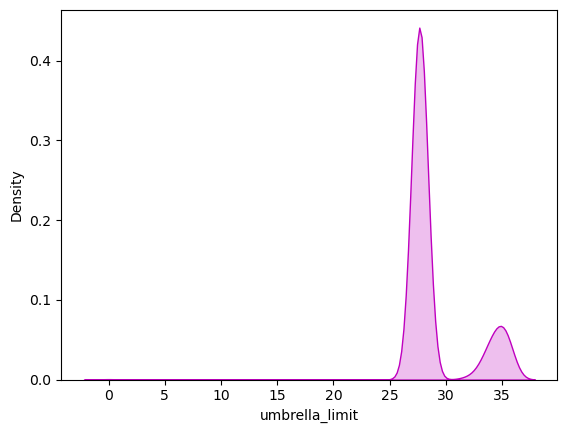

In [80]:
#Let Visualize if the skewneww is removed. 
sns.distplot(df1["umbrella_limit"], color='m', kde_kws={"shade":True}, hist=False)
plt.show()

In [81]:
df1.skew()

months_as_customer             0.362608
age                            0.475385
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 0.410883
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_type                  0.090563
collision_type                -0.032778
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
number_of_vehicles_involved    0.509725
property_damage                0.853093
bodily_injuries                0.003757
witnesses                      0.026211
police_report_available        0.796221


# Separating Features and Label/target variables

In [82]:
x=df1.drop("fraud_reported",axis=1)
y=df1["fraud_reported"]

In [83]:
x

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model
0,328,48,2.0,1.0,1000,1406.91,27.668071,1.0,4.0,2.0,...,1.0,1,2,1.0,71610,6510,13020,52080,10.0,1.0
1,228,42,1.0,1.0,2000,1197.22,34.520360,1.0,4.0,6.0,...,0.0,0,0,0.0,5070,780,780,3510,8.0,12.0
2,134,29,2.0,0.0,2000,1413.14,34.520360,0.0,6.0,11.0,...,0.0,2,3,0.0,34650,7700,3850,23100,4.0,30.0
3,256,41,0.0,1.0,2000,1415.74,35.163817,0.0,6.0,1.0,...,0.0,1,2,0.0,63400,6340,6340,50720,3.0,34.0
4,228,44,0.0,2.0,1000,1583.91,35.163817,1.0,0.0,11.0,...,0.0,0,1,0.0,6500,1300,650,4550,0.0,31.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2.0,2.0,1000,1310.80,27.668071,0.0,5.0,2.0,...,1.0,0,1,0.0,87200,17440,8720,61040,6.0,6.0
996,285,41,0.0,0.0,1000,1436.79,27.668071,0.0,6.0,9.0,...,1.0,2,3,0.0,108480,18080,18080,72320,13.0,28.0
997,130,34,2.0,1.0,500,1383.49,32.870385,0.0,5.0,1.0,...,0.0,2,3,1.0,67500,7500,7500,52500,11.0,19.0
998,458,62,0.0,2.0,2000,1356.92,34.520360,1.0,0.0,5.0,...,0.0,0,1,1.0,46980,5220,5220,36540,1.0,5.0


In [84]:
y

0      1.0
1      1.0
2      0.0
3      1.0
4      0.0
      ... 
995    0.0
996    0.0
997    0.0
998    0.0
999    0.0
Name: fraud_reported, Length: 980, dtype: float64

# Feature Scaling using Standard Scaling Method (Normalization)

In [85]:
#Using Standard Scalar
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
X

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model
0,1.069568,0.983352,1.179821,0.067231,-0.224643,0.620031,-0.444463,1.071971,0.532901,-1.156087,...,1.512809,0.002498,0.466378,1.473608,0.718507,-0.187627,1.176015,0.753824,0.851959,-1.640447
1,0.202726,0.329711,-0.024580,0.067231,1.412161,-0.248448,1.922093,1.071971,0.532901,-0.160292,...,-0.661022,-1.221626,-1.333033,-0.678606,-1.808821,-1.361005,-1.378984,-1.824679,0.355279,-0.651740
2,-0.612105,-1.086511,1.179821,-1.175916,1.412161,0.645834,1.922093,-0.932861,1.556905,1.084451,...,-0.661022,1.226623,1.366083,-0.678606,-0.685311,0.056059,-0.738147,-0.784678,-0.638083,0.966145
3,0.445442,0.220771,-1.228980,0.067231,1.412161,0.656603,2.144321,-0.932861,1.556905,-1.405036,...,-0.661022,0.002498,0.466378,-0.678606,0.406674,-0.222439,-0.218380,0.681623,-0.886423,1.325675
4,0.202726,0.547591,-1.228980,1.310379,-0.224643,1.353117,2.144321,1.071971,-1.515109,1.084451,...,-0.661022,-1.221626,-0.433327,-0.678606,-1.754507,-1.254521,-1.406121,-1.769467,-1.631444,1.056027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,-1.747669,-0.106050,1.179821,1.310379,-0.224643,0.221970,-0.444463,-0.932861,1.044903,-1.156087,...,1.512809,-1.221626,-0.433327,-0.678606,1.310648,2.050597,0.278425,1.229496,-0.141402,-1.191035
976,0.696826,0.220771,-1.228980,-1.175916,-0.224643,0.743786,-0.444463,-0.932861,1.556905,0.586554,...,1.512809,1.226623,1.366083,-0.678606,2.118906,2.181655,2.232248,1.828332,1.596980,0.786380
977,-0.646779,-0.541810,1.179821,0.067231,-1.043045,0.523032,1.352245,-0.932861,1.044903,-1.405036,...,-0.661022,1.226623,1.366083,1.473608,0.562400,0.015103,0.023760,0.776121,1.100300,-0.022562
978,2.196463,2.508513,-1.228980,1.310379,1.412161,0.412986,1.922093,1.071971,-1.515109,-0.409241,...,-0.661022,-1.221626,-0.433327,1.473608,-0.216992,-0.451791,-0.452171,-0.071170,-1.383104,-1.280917


# Checking Variace inflation factor(VIF)

In [86]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
v=variance_inflation_factor
vif=pd.DataFrame()
vif["VIF Values"]=[v(X.values,i) for i in range(len(X.columns))]
vif["Features"]=x.columns
vif

,VIF Values,Features
0,6.884657,months_as_customer
1,6.886621,age
2,1.028374,policy_state
3,1.025209,policy_csl
4,1.035770,policy_deductable
5,1.031999,policy_annual_premium
6,1.035046,umbrella_limit
7,1.021993,insured_sex
8,1.032765,insured_education_level
9,1.013829,insured_occupation


#### It is observed that 'total_claim_amount' is the sum of all the three other claims 'injury_claim','property_claim', 'vehicle_claim'. So lets drop 'total_claim_amount' and check vif values.  

In [87]:
#Droping Temp3pm col first 
X.drop("total_claim_amount", axis=1,inplace=True)

In [88]:
vif=pd.DataFrame()
vif["VIF Values"]=[v(X.values,i) for i in range(len(X.columns))]
vif["Features"]=X.columns
vif

,VIF Values,Features
0,6.884657,months_as_customer
1,6.886621,age
2,1.028374,policy_state
3,1.025209,policy_csl
4,1.035770,policy_deductable
5,1.031999,policy_annual_premium
6,1.035046,umbrella_limit
7,1.021993,insured_sex
8,1.032765,insured_education_level
9,1.013829,insured_occupation


#### In Standard Sacaler technique we see that the vif values have minimized and are less than 10. Hense the multicollinearity issue is solved

## Now all the values are below vif value 10 . We can prroceed further with the data for Modelling

In [89]:
y.value_counts()

0.0    740
1.0    240
Name: fraud_reported, dtype: int64

#### The target variable is imbalanced and hense will have to use SMOTE method to Balance the Data

In [90]:
!pip install scikit-learn==1.2.2
!pip install imblearn

In [91]:
from imblearn.over_sampling import SMOTE
SM=SMOTE()
x1, y1 = SM.fit_resample(X,y)

In [92]:
#checking value count of target column
y1.value_counts()

1.0    740
0.0    740
Name: fraud_reported, dtype: int64

In [93]:
x1.value_counts()

months_as_customer  age        policy_state  policy_csl  policy_deductable  policy_annual_premium  umbrella_limit  insured_sex  insured_education_level  insured_occupation  insured_hobbies  insured_relationship  capital-gains  capital-loss  incident_type  collision_type  incident_severity  authorities_contacted  incident_state  incident_city  number_of_vehicles_involved  property_damage  bodily_injuries  witnesses  police_report_available  injury_claim  property_claim  vehicle_claim  auto_make  auto_model
-1.773674           -0.759691   1.179821      1.310379   -0.224643           0.496318              -0.444463        1.071971    -1.003107                 1.333400           -1.712507         1.535531              1.294124      -0.515705     -1.090309      -0.029459       -0.195509          -1.411503              -1.039963        1.481940       2.127415                    -0.661022         0.002498        -0.433327  -0.678606                -0.165101     -0.159932       -0.605239      

In [94]:
print("Shape of x1:", x1.shape)
print("Shape of y1:", y1.shape)

Shape of x1: (1480, 30)
Shape of y1: (1480,)


# Modelling or Model Buildingn and Cross_valuation Score

In [95]:
from sklearn.linear_model import LogisticRegression

from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,precision_score,recall_score,f1_score,roc_curve
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,BaggingClassifier,GradientBoostingClassifier,ExtraTreesClassifier

from sklearn.model_selection import GridSearchCV

import warnings
from sklearn.model_selection import cross_val_score
warnings.filterwarnings('ignore')

In [98]:
from sklearn.model_selection import train_test_split
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test= train_test_split(x1,y1,test_size=0.20,random_state=i)
    RFR=RandomForestClassifier()
    RFR.fit(x_train,y_train)
    pred=RFR.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is", maxAccu,"at random_state", maxRS)

Best accuracy is 0.9391891891891891 at random_state 95


In [99]:
#Creating train test Split 
x_train,x_test,y_train,y_test= train_test_split(x1,y1,test_size=0.20,random_state=95)

In [100]:
print('Size of x_train : ', x_train.shape)
print('Size of y_train : ', y_train.shape)
print('Size of x_test : ', x_test.shape)
print('Size of y_test : ', y_test.shape)
print('predicted_values:', pred)

Size of x_train :  (1184, 30)
Size of y_train :  (1184,)
Size of x_test :  (296, 30)
Size of y_test :  (296,)
predicted_values: [0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 0.
 1. 1. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 0.
 1. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0.
 0. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 0. 1. 0. 0. 1. 1. 1. 1. 0. 1. 0.
 0. 1. 1. 0. 0. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0. 1.
 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 1. 1. 1.
 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1.
 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 0.
 0. 0. 0. 1. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 1. 0. 0. 1. 1. 1. 0. 0. 0. 0.
 1. 0. 1. 0. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 1. 1. 1. 0. 1. 0.
 1. 0. 1. 0. 1. 0. 1. 1. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.

In [101]:
# checking accuracy for RandomForestClassifier
RFC=RandomForestClassifier()
RFC.fit(x_train,y_train)
predRFC=RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))
#checking cv score for Random Forest classifier
score1=cross_val_score(RFC,x1,y1)
print(score1)
print(score1.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predRFC)-score1.mean())

0.9324324324324325
[[140  14]
 [  6 136]]
              precision    recall  f1-score   support

         0.0       0.96      0.91      0.93       154
         1.0       0.91      0.96      0.93       142

    accuracy                           0.93       296
   macro avg       0.93      0.93      0.93       296
weighted avg       0.93      0.93      0.93       296

[0.75337838 0.85135135 0.91891892 0.93581081 0.93581081]
0.879054054054054
Difference between Accuraccy_Score and CVS is = 0.053378378378378444


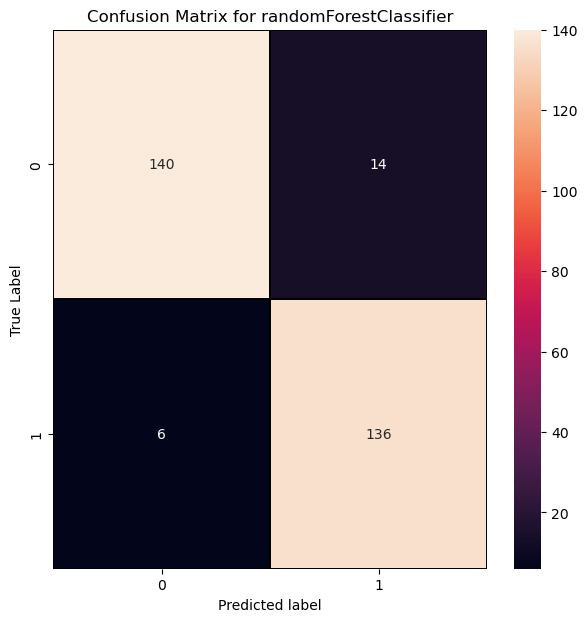

In [102]:
#Lets plot confusion mTatrix for RandomForestClassifier
cm=confusion_matrix(y_test,predRFC)
x_axis_labels=["0","1"]
y_axis_labels= ["0","1"]
f, ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm,annot=True, linewidths=0.2, linecolor="black",fmt=".0f",ax=ax, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("Predicted label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for randomForestClassifier")
plt.show()

In [103]:
svc=SVC()
svc.fit(x_train,y_train)
predsvc=svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))
#checking cv score for Support Vector classifier
score2=cross_val_score(svc,x1,y1)
print(score2)
print(score2.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predsvc)-score2.mean())

0.8817567567567568
[[133  21]
 [ 14 128]]
              precision    recall  f1-score   support

         0.0       0.90      0.86      0.88       154
         1.0       0.86      0.90      0.88       142

    accuracy                           0.88       296
   macro avg       0.88      0.88      0.88       296
weighted avg       0.88      0.88      0.88       296

[0.77702703 0.80405405 0.85135135 0.89527027 0.90202703]
0.845945945945946
Difference between Accuraccy_Score and CVS is = 0.035810810810810834


In [104]:
GB=GradientBoostingClassifier()
GB.fit(x_train,y_train)
predGB=GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test,predGB))
print(classification_report(y_test,predGB))
#checking cv score for Gradient Boosting classifier
score3=cross_val_score(GB,x1,y1)
print(score3)
print(score3.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predGB)-score3.mean())

0.9087837837837838
[[139  15]
 [ 12 130]]
              precision    recall  f1-score   support

         0.0       0.92      0.90      0.91       154
         1.0       0.90      0.92      0.91       142

    accuracy                           0.91       296
   macro avg       0.91      0.91      0.91       296
weighted avg       0.91      0.91      0.91       296

[0.76689189 0.86486486 0.90540541 0.91554054 0.9222973 ]
0.875
Difference between Accuraccy_Score and CVS is = 0.03378378378378377


In [105]:
ABC=AdaBoostClassifier()
ABC.fit(x_train,y_train)
predABC=ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test,predABC))
print(classification_report(y_test,predABC))
#checking cv score for AdaBoosting classifier
score4=cross_val_score(ABC,x1,y1)
print(score4)
print(score4.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predABC)-score4.mean())

0.8986486486486487
[[145   9]
 [ 21 121]]
              precision    recall  f1-score   support

         0.0       0.87      0.94      0.91       154
         1.0       0.93      0.85      0.89       142

    accuracy                           0.90       296
   macro avg       0.90      0.90      0.90       296
weighted avg       0.90      0.90      0.90       296

[0.69594595 0.79054054 0.90202703 0.90878378 0.93243243]
0.845945945945946
Difference between Accuraccy_Score and CVS is = 0.05270270270270272


In [106]:
LR=LogisticRegression()
LR.fit(x_train,y_train)
predLR=LR.predict(x_test)
print(accuracy_score(y_test,predLR))
print(confusion_matrix(y_test,predLR))
print(classification_report(y_test,predLR))
#checking cv score for Logistic regresssion
score5=cross_val_score(LR,x1,y1)
print(score5)
print(score5.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predLR)-score5.mean())

0.7263513513513513
[[111  43]
 [ 38 104]]
              precision    recall  f1-score   support

         0.0       0.74      0.72      0.73       154
         1.0       0.71      0.73      0.72       142

    accuracy                           0.73       296
   macro avg       0.73      0.73      0.73       296
weighted avg       0.73      0.73      0.73       296

[0.72297297 0.72635135 0.72635135 0.72972973 0.76689189]
0.7344594594594595
Difference between Accuraccy_Score and CVS is = -0.008108108108108136


In [107]:
BC=BaggingClassifier()
BC.fit(x_train,y_train)
predBC=BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test,predBC))
print(classification_report(y_test,predBC))
#checking cv score for Bagging classifier
score6=cross_val_score(BC,x1,y1)
print(score6)
print(score6.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predBC)-score6.mean())

0.8885135135135135
[[135  19]
 [ 14 128]]
              precision    recall  f1-score   support

         0.0       0.91      0.88      0.89       154
         1.0       0.87      0.90      0.89       142

    accuracy                           0.89       296
   macro avg       0.89      0.89      0.89       296
weighted avg       0.89      0.89      0.89       296

[0.7972973  0.83783784 0.90202703 0.88175676 0.90878378]
0.8655405405405407
Difference between Accuraccy_Score and CVS is = 0.02297297297297274


In [108]:
ET=ExtraTreesClassifier()
ET.fit(x_train,y_train)
predET=ET.predict(x_test)
print(accuracy_score(y_test,predET))
print(confusion_matrix(y_test,predET))
print(classification_report(y_test,predET))
#checking cv score for Extra Tree classifier
score7=cross_val_score(ET,x1,y1)
print(score7)
print(score7.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predET)-score7.mean())

0.9290540540540541
[[143  11]
 [ 10 132]]
              precision    recall  f1-score   support

         0.0       0.93      0.93      0.93       154
         1.0       0.92      0.93      0.93       142

    accuracy                           0.93       296
   macro avg       0.93      0.93      0.93       296
weighted avg       0.93      0.93      0.93       296

[0.86824324 0.875      0.92567568 0.95608108 0.94256757]
0.9135135135135135
Difference between Accuraccy_Score and CVS is = 0.015540540540540548


In [109]:
from sklearn.tree import DecisionTreeClassifier
DTC =DecisionTreeClassifier()
DTC.fit(x_train,y_train)
predDTC=DTC.predict(x_test)
print(accuracy_score(y_test,predDTC))
print(confusion_matrix(y_test,predDTC))
print(classification_report(y_test,predDTC))
#checking cv score for Decision Tree classifier
score8=cross_val_score(DTC,x1,y1)
print(score8)
print(score8.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predDTC)-score8.mean())

0.8648648648648649
[[135  19]
 [ 21 121]]
              precision    recall  f1-score   support

         0.0       0.87      0.88      0.87       154
         1.0       0.86      0.85      0.86       142

    accuracy                           0.86       296
   macro avg       0.86      0.86      0.86       296
weighted avg       0.86      0.86      0.86       296

[0.71283784 0.79054054 0.88851351 0.87162162 0.91554054]
0.8358108108108109
Difference between Accuraccy_Score and CVS is = 0.029054054054054035


In [110]:
knn =KNeighborsClassifier()
knn.fit(x_train,y_train)
predknn=knn.predict(x_test)
print(accuracy_score(y_test,predknn))
print(confusion_matrix(y_test,predknn))
print(classification_report(y_test,predknn))
#checking cv score for K Neighbors Classifier
score9=cross_val_score(knn,x1,y1)
print(score9)
print(score9.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predknn)-score9.mean())

0.6891891891891891
[[ 63  91]
 [  1 141]]
              precision    recall  f1-score   support

         0.0       0.98      0.41      0.58       154
         1.0       0.61      0.99      0.75       142

    accuracy                           0.69       296
   macro avg       0.80      0.70      0.67       296
weighted avg       0.80      0.69      0.66       296

[0.65202703 0.64527027 0.68243243 0.72297297 0.71959459]
0.6844594594594595
Difference between Accuraccy_Score and CVS is = 0.004729729729729626


In [111]:
model=[('RandomForestClassifier',accuracy_score(y_test,predRFC),score1.mean(),accuracy_score(y_test,predRFC)-score1.mean()),
      ('SVC',accuracy_score(y_test,predsvc),score2.mean(),accuracy_score(y_test,predsvc)-score2.mean()),
      ('GradientBoostingClassifier',accuracy_score(y_test,predGB),score3.mean(),accuracy_score(y_test,predGB)-score3.mean()),
      ('AdaBoostClassifier',accuracy_score(y_test,predABC),score4.mean(),accuracy_score(y_test,predABC)-score4.mean()),
      ('LogisticRegression',accuracy_score(y_test,predLR),score5.mean(),accuracy_score(y_test,predLR)-score5.mean()),
      ('BaggingClassifier',accuracy_score(y_test,predBC),score6.mean(),accuracy_score(y_test,predBC)-score6.mean()),
      ('ExtraTreesClassifier',accuracy_score(y_test,predET),score7.mean(),accuracy_score(y_test,predET)-score7.mean()),
    ('DecisionTreesClassifier',accuracy_score(y_test,predDTC),score8.mean(),accuracy_score(y_test,predDTC)-score8.mean()),
    ('KNeighborsClassifier',accuracy_score(y_test,predknn),score9.mean(),accuracy_score(y_test,predknn)-score9.mean())
      ]

In [112]:
Model = pd.DataFrame(data = model, columns=['Model','Accuracy Score','Cross Validation', 'Difference'])
Model

,Model,Accuracy Score,Cross Validation,Difference
0,RandomForestClassifier,0.932432,0.879054,0.053378
1,SVC,0.881757,0.845946,0.035811
2,GradientBoostingClassifier,0.908784,0.875000,0.033784
3,AdaBoostClassifier,0.898649,0.845946,0.052703
4,LogisticRegression,0.726351,0.734459,-0.008108
5,BaggingClassifier,0.888514,0.865541,0.022973
6,ExtraTreesClassifier,0.929054,0.913514,0.015541
7,DecisionTreesClassifier,0.864865,0.835811,0.029054
8,KNeighborsClassifier,0.689189,0.684459,0.004730


#### It is very clear that the best suitable model is Extra Tree Classifier. with Accuracy score 0.92 and cross-validation is 0.91

# Hyper Parameter Tuning

In [113]:
from sklearn.model_selection import RandomizedSearchCV
# Define the hyperparameters distribution to search
param_dist = {'criterion': ['gini','entropy'],
              'random_state':[10,50,1000],
    'n_estimators': [50, 100, 200, 400, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 4, 6, 8],
    'bootstrap': [False, True]
}

In [114]:
# Initialize RandomizedSearchCV with 5-fold cross-validation
random_search = RandomizedSearchCV(estimator=ET, param_distributions=param_dist, n_iter=100, cv=5, n_jobs=-1, verbose=2, random_state=95)

In [115]:
# Fit the model
random_search.fit(x1, y1)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=ExtraTreesClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [False, True],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [None, 10, 20, 30, 40, 50],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 15, 20],
                                        'n_estimators': [50, 100, 200, 400,
                                                         500],
                                        'random_state': [10, 50, 1000]},
                   random_state=95, verbose=2)

In [116]:
# Print the best parameters and the best score
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

Best Parameters: {'random_state': 1000, 'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 40, 'criterion': 'entropy', 'bootstrap': False}
Best Score: 0.9135135135135135


In [117]:
# Get the best estimator
best_etc = random_search.best_estimator_

In [118]:
# Predict and evaluate
y_pred = best_etc.predict(x1)
print(classification_report(y1, y_pred))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       740
         1.0       1.00      1.00      1.00       740

    accuracy                           1.00      1480
   macro avg       1.00      1.00      1.00      1480
weighted avg       1.00      1.00      1.00      1480



In [120]:
Final_model=ExtraTreesClassifier(random_state=95, n_estimators=50, min_samples_split=2, min_samples_leaf=1, max_features='log2', max_depth=40, criterion= 'entropy', bootstrap= False)
Final_model.fit(x_train,y_train)
pred=Final_model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

93.24324324324324


### Hense with Hyper tuning we havee tried increasing the Acccuracy Score 

# Ploting ROC AUC Curve

In [121]:
#Plotting for all the models used here
from sklearn import datasets
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import RocCurveDisplay

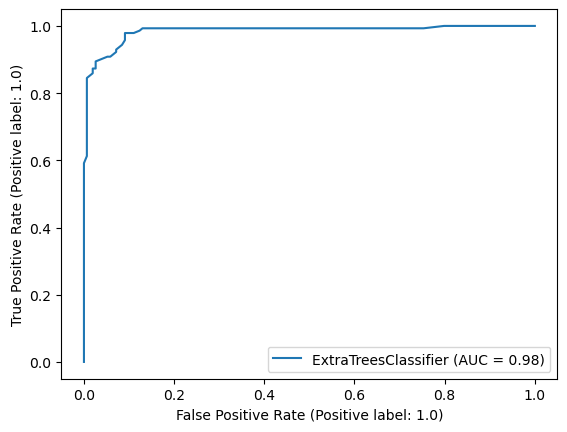

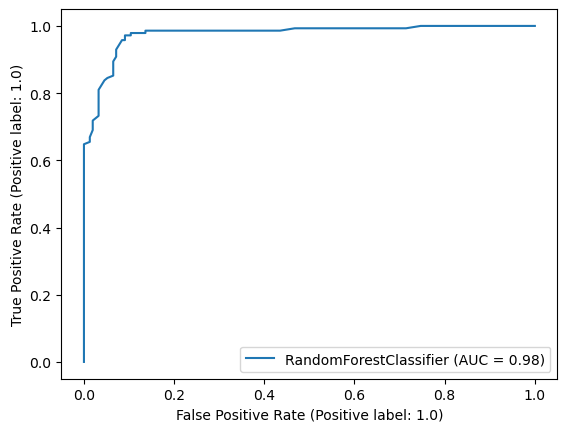

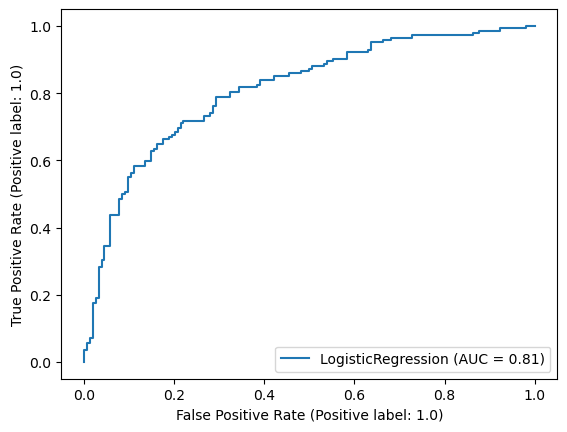

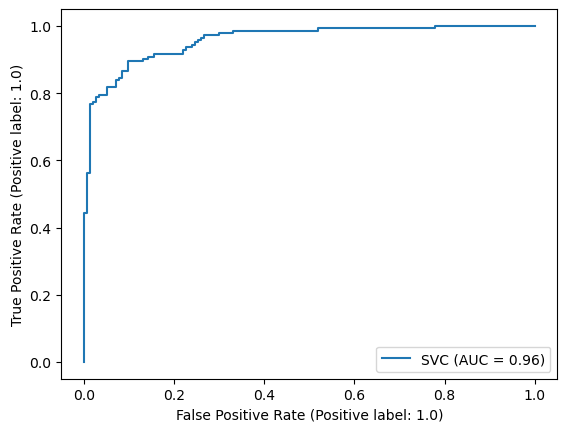

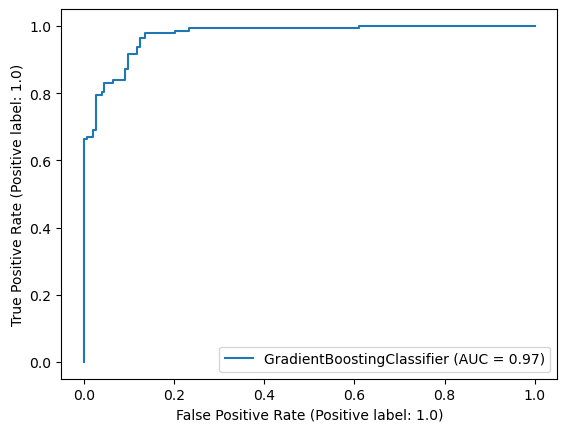

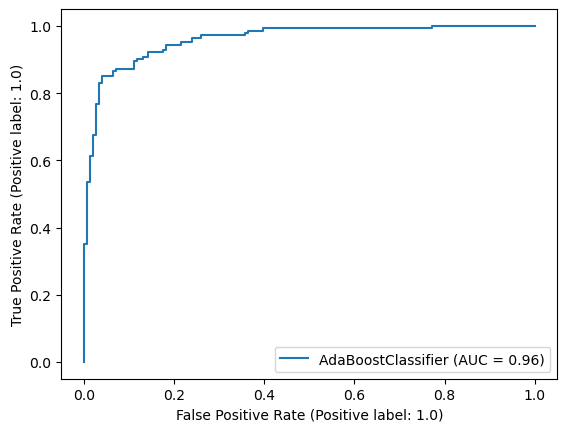

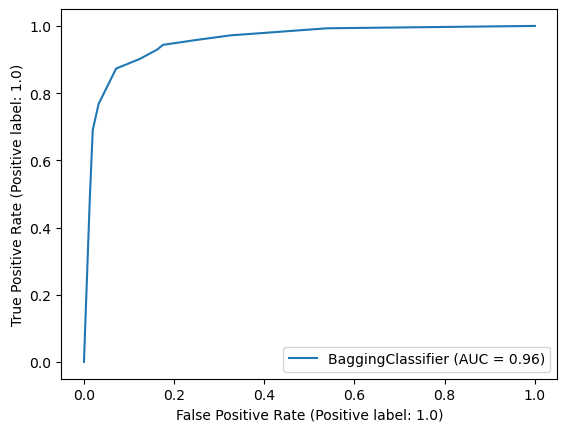

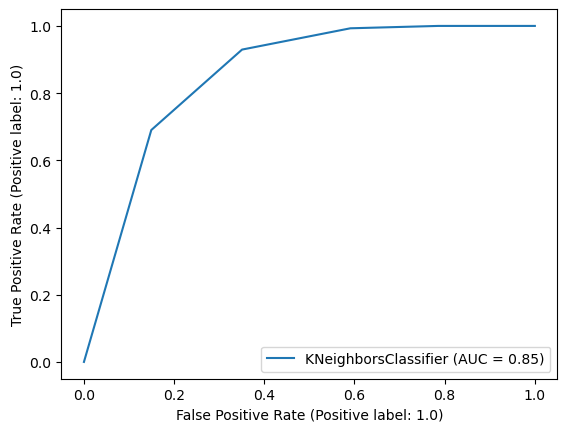

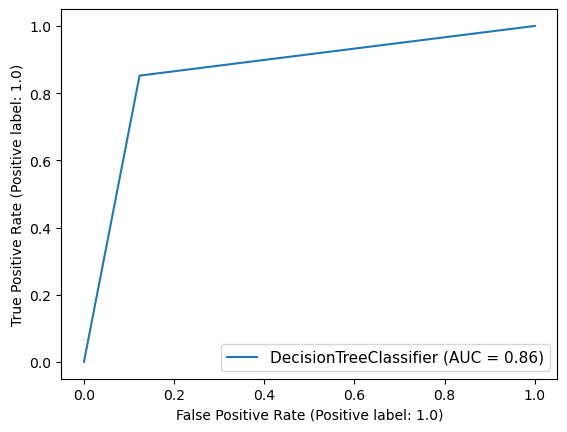

In [122]:
display= RocCurveDisplay.from_estimator(ET,x_test,y_test) #ax =Axes with confusion Matrix
RocCurveDisplay.from_estimator(RFC,x_test,y_test)
RocCurveDisplay.from_estimator(LR,x_test,y_test)
RocCurveDisplay.from_estimator(svc,x_test,y_test)
RocCurveDisplay.from_estimator(GB,x_test,y_test)
RocCurveDisplay.from_estimator(ABC,x_test,y_test)
RocCurveDisplay.from_estimator(BC,x_test,y_test)
RocCurveDisplay.from_estimator(knn,x_test,y_test)
RocCurveDisplay.from_estimator(DTC,x_test,y_test)

plt.legend(prop={'size':11},loc='lower right')
plt.show()

# Plotting ROC and compare AUC for the Best Model

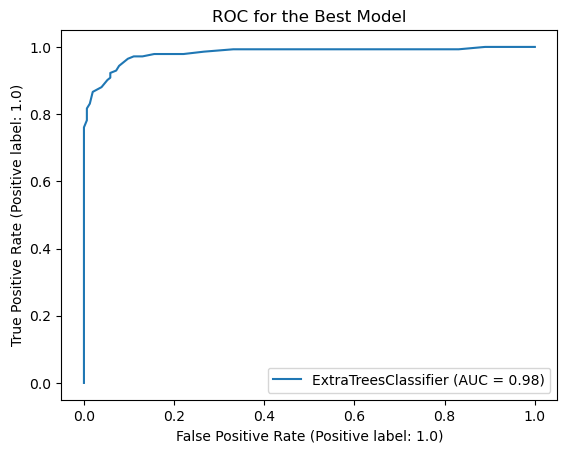

In [123]:
#Lets check the AUC for the best model after hyper parameter tuning
RocCurveDisplay.from_estimator(Final_model,x_test,y_test)
plt.title("ROC for the Best Model")
plt.show()

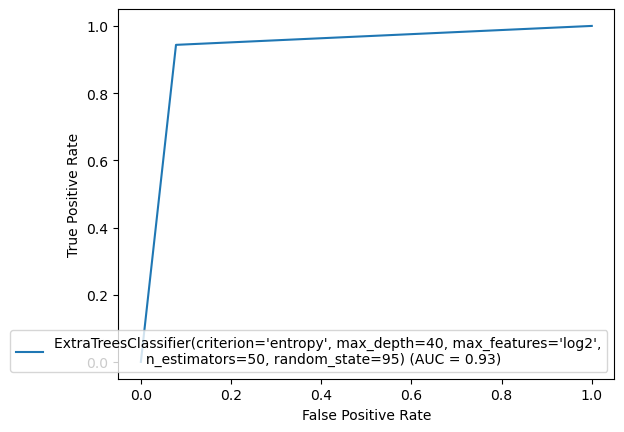

In [124]:
from sklearn import metrics
fpr,tpr,thesholds=metrics.roc_curve(y_test,pred)
roc_auc=metrics.auc(fpr,tpr)
display=metrics.RocCurveDisplay(fpr=fpr,tpr=tpr,roc_auc=roc_auc,estimator_name=Final_model)
display.plot()

#### Here we have plotted the ROC curve for the final model and the AUC value for the best model is 93%

# Saving the Model

In [125]:
#saving the model using .pkl
import joblib
joblib.dump(Final_model,"Insurance_Claim_Fraud_Prediction.pkl")

['Insurance_Claim_Fraud_Prediction.pkl']

# Predicting the saved model

In [126]:
#lets load the saved model and get the predictions
model=joblib.load('Insurance_Claim_Fraud_Prediction.pkl')

#Prediction
prediction=model.predict(x_test)
prediction

array([1., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 0.,
       0., 1., 1., 1., 0., 0., 1., 1., 1., 1., 0., 1., 1., 0., 1., 0., 1.,
       0., 1., 1., 1., 1., 0., 0., 1., 0., 0., 1., 1., 1., 0., 0., 1., 0.,
       1., 1., 0., 0., 0., 1., 0., 1., 0., 0., 1., 1., 0., 0., 1., 1., 1.,
       1., 1., 1., 0., 1., 1., 1., 0., 0., 1., 0., 1., 1., 0., 1., 0., 0.,
       1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 1., 1., 1., 0., 0., 0., 0.,
       1., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1.,
       1., 1., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 1., 0., 1., 0.,
       1., 1., 1., 1., 1., 0., 1., 0., 0., 1., 0., 0., 0., 1., 0., 0., 1.,
       0., 0., 0., 1., 0., 1., 1., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 1., 1., 0., 0., 0., 1., 1., 0., 1., 0., 1., 1., 0., 1.,
       0., 1., 1., 1., 0., 0., 1., 1., 1., 1., 0., 0., 0., 1., 0., 1., 1.,
       0., 1., 1., 0., 1., 0., 1., 1., 1., 0., 0., 0., 1., 1., 0., 1., 1.,
       0., 0., 0., 1., 0.

#### These are predicted values of Fraud  and Non-Fraud cases. 

In [127]:
a=np.array(y_test)
df=pd.DataFrame()
df["Predicted"]=prediction
df["Original"]=a
df

,Predicted,Original
0,1.0,1.0
1,0.0,0.0
2,0.0,0.0
3,1.0,1.0
4,1.0,1.0
...,...,...
291,0.0,0.0
292,0.0,0.0
293,0.0,0.0
294,0.0,0.0


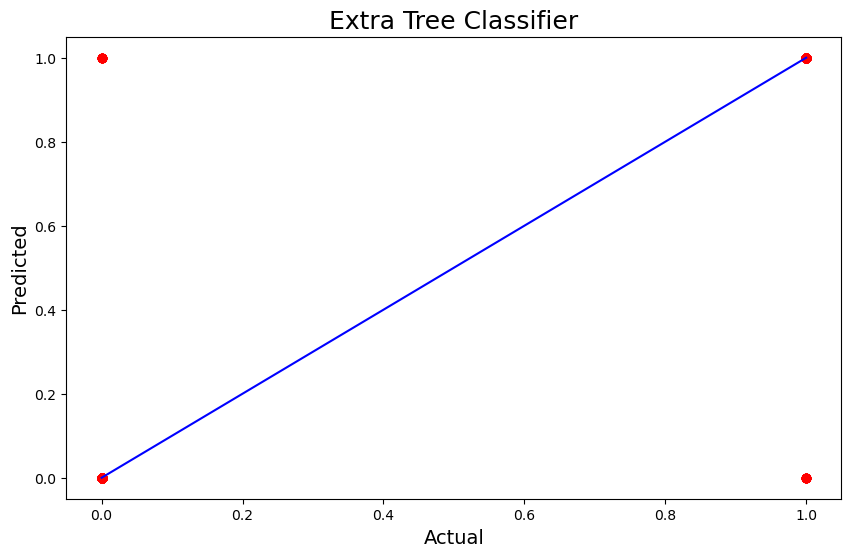

In [130]:
## Ploting a chart to see thee predicted values
plt.figure(figsize=(10,6))
plt.scatter(x=predET,y=y_test,color='r')
plt.plot(predET,predET,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted', fontsize=14)
plt.title('Extra Tree Classifier', fontsize=18)
plt.show()

# We have predicted for 296 rows using the best suitable model Extra Tree Classifier.